# **Language, Computation and Cognition - FInal Project**
## **Open Ended Tasks**
### Lihi Kaspi (214676140) and Harel Oved (326042389)

In [1]:
!pip install pyreadr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 411.7/411.7 kB 4.9 MB/s eta 0:00:00


In [2]:
import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.gam.generalized_additive_model import GLMGam
from statsmodels.gam.smooth_basis import BSplines
import pyreadr
import torch
from datasets import load_dataset
from transformers import AutoTokenizer, AutoModelForCausalLM
import math
import string
from statsmodels.genmod.families import Gaussian
from transformers import XLMRobertaTokenizer, XLMRobertaForMaskedLM, XLMRobertaTokenizerFast
from statsmodels.nonparametric.smoothers_lowess import lowess

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Open Ended Task

## Opening MECO Files

In [ ]:
meco_wave1_path = '/content/drive/MyDrive/language_and_cognition/MECO/wave 1/primary data/eye tracking data'
meco_wave2_path = '/content/drive/MyDrive/language_and_cognition/MECO/wave 2/primary data/eye tracking data'

In [ ]:
meco_wave1_joint_l1 = pyreadr.read_r(f'{meco_wave1_path}/joint_l1_data_trimmed_version2.0.rda')
meco_wave1_readrate_l1 = pyreadr.read_r(f'{meco_wave1_path}/joint.readrate_version2.0.rda')
meco_wave1_sacc_l1 = pyreadr.read_r(f'{meco_wave1_path}/joint_sac_trimmed_l1_wave1_version2.0.rda')
meco_wave1_fix_l1 = pyreadr.read_r(f'{meco_wave1_path}/fixation report/joint_l1_fixation_version2.0.rda')
meco_wave1_passage_data = pd.read_csv(f'{meco_wave1_path}/passage_data_version2.0.csv')
meco_wave1_sentence = pd.read_csv(f'{meco_wave1_path}/sentence_data_version2.0.csv')

In [ ]:
meco_wave2_joint_l1 = pyreadr.read_r(f'{meco_wave2_path}/joint_data_trimmed_wave2_version2.0.rda')
meco_wave2_readrate_l1 = pyreadr.read_r(f'{meco_wave2_path}/joint_readrate_wave2_version2.0.rda')
meco_wave2_sacc_l1 = pyreadr.read_r(f'{meco_wave2_path}/joint_sac_trimmed_l1_wave2_version2.0.RDA')
meco_wave2_fix_l1 = pyreadr.read_r(f'{meco_wave2_path}/joint_fix_trimmed_l1_wave2_MinusCh_version2.0.RDA')
meco_wave2_passage_data = pyreadr.read_r(f'{meco_wave2_path}/joint_passage_trimmed_wave2_version2.0.rda')
meco_wave2_sentence = pyreadr.read_r(f'{meco_wave2_path}/joint_sent_trimmed_wave2_2025-01-01.rda')

## Calculating Surprisals For MECO

### Extracting dfs

In [ ]:
meco_wave1_joint_l1 = meco_wave1_joint_l1['joint.data']
meco_wave1_readrate_l1 = meco_wave1_readrate_l1['u']
meco_wave1_sacc_l1 = meco_wave1_sacc_l1['joint.sac']
meco_wave1_fix_l1 = meco_wave1_fix_l1['joint.fix']

In [ ]:
meco_wave1_joint_l1.head()

,subid,trialid,itemid,cond,sentnum,wordnum,word,blink,skip,nrun,reread,nfix,refix,reg.in,reg.out,dur,firstrun.skip,firstrun.nfix,firstrun.refix,firstrun.reg.in,firstrun.reg.out,firstrun.dur,firstrun.gopast,firstrun.gopast.sel,firstfix.sac.in,firstfix.sac.out,firstfix.launch,firstfix.land,firstfix.cland,firstfix.dur,singlefix,singlefix.sac.in,singlefix.sac.out,singlefix.launch,singlefix.land,singlefix.cland,singlefix.dur,lang,trial,supplementary_id,uniform_id
0,du_01,1.0,1,1.0,7.0,125.0,van,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,93.0,1.0,1.0,0.0,0.0,0.0,93.0,0.0,0.0,5,10,3.0,2.0,0.0,93.0,1.0,5,10,3.0,2.0,0.0,93.0,du,NaN,DU_01,du_1
1,du_01,1.0,1,1.0,7.0,124.0,begin,0.0,0.0,2.0,1.0,2.0,0.0,1.0,1.0,496.0,0.0,1.0,0.0,0.0,1.0,224.0,457.0,224.0,17,-6,13.0,4.0,1.0,224.0,1.0,17,-6,13.0,4.0,1.0,224.0,du,NaN,DU_01,du_1
2,du_01,1.0,1,1.0,8.0,146.0,"toegewezen,",0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,191.0,1.0,1.0,0.0,1.0,0.0,191.0,0.0,0.0,-10,22,-8.0,4.0,-2.0,191.0,1.0,-10,22,-8.0,4.0,-2.0,191.0,du,NaN,DU_01,du_1
3,du_01,1.0,1,1.0,8.0,147.0,maar,1.0,0.0,2.0,1.0,2.0,0.0,1.0,1.0,325.0,0.0,1.0,0.0,0.0,1.0,139.0,330.0,139.0,-86,-10,-83.0,2.0,-0.5,139.0,1.0,-86,-10,-83.0,2.0,-0.5,139.0,du,NaN,DU_01,du_1
4,du_01,1.0,1,1.0,8.0,148.0,de,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,du,NaN,DU_01,du_1


In [ ]:
meco_wave2_joint_l1 = meco_wave2_joint_l1['joint.data']
meco_wave2_readrate_l1 = meco_wave2_readrate_l1['read_rate']
meco_wave2_sacc_l1 = meco_wave2_sacc_l1['joint.sac']
meco_wave2_fix_l1 = meco_wave2_fix_l1['joint.fix']
meco_wave2_passage_data = meco_wave2_passage_data['joint.passage']
meco_wave2_sentence_data = meco_wave2_sentence['joint.sent']
meco_wave2_sentence_data_ch = meco_wave2_sentence['ch.sent']
meco_wave2_sentence_data_tw = meco_wave2_sentence['tw.sent']

In [ ]:
meco_wave2_joint_l1.head()

,subid,trialid,trialnum,itemid,cond,sentnum,wordnum,word,blink,skip,nrun,reread,nfix,refix,reg.in,reg.out,dur,firstrun.skip,firstrun.nfix,firstrun.refix,firstrun.reg.in,firstrun.reg.out,firstrun.dur,firstrun.gopast,firstrun.gopast.sel,firstfix.sac.in,firstfix.sac.out,firstfix.launch,firstfix.land,firstfix.cland,firstfix.dur,singlefix,singlefix.sac.in,singlefix.sac.out,singlefix.launch,singlefix.land,singlefix.cland,singlefix.dur,lang,trial,supplementary_id,uniform_id
0,53_6415,1.0,1.0,0,1.0,1.0,1.0,Antzinako,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,132.0,1.0,1.0,0.0,1.0,0.0,132.0,0.0,0.0,5,8,-2.0,7.0,2.0,132.0,1.0,5,8,-2.0,7.0,2.0,132.0,ba,NaN,NaN,ba_56
1,53_6415,1.0,1.0,0,1.0,1.0,2.0,Erromako,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,236.0,1.0,1.0,0.0,0.0,0.0,236.0,0.0,0.0,8,8,3.0,5.0,0.5,236.0,1.0,8,8,3.0,5.0,0.5,236.0,ba,NaN,NaN,ba_56
2,53_6415,1.0,1.0,0,1.0,1.0,3.0,erlijio,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,208.0,1.0,1.0,0.0,0.0,0.0,208.0,0.0,0.0,8,11,4.0,4.0,0.0,208.0,1.0,8,11,4.0,4.0,0.0,208.0,ba,NaN,NaN,ba_56
3,53_6415,1.0,1.0,0,1.0,1.0,4.0,eta,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,ba,NaN,NaN,ba_56
4,53_6415,1.0,1.0,0,1.0,1.0,5.0,"mitologian,",0.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,470.0,1.0,2.0,1.0,0.0,0.0,470.0,0.0,0.0,11,5,8.0,3.0,-3.0,338.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,ba,NaN,NaN,ba_56


In [ ]:
meco_wave2_readrate_l1.head()

,uniform_id,lang,trialid,rate
0,ba_56,ba,1.0,159.0
1,ba_56,ba,2.0,129.0
2,ba_56,ba,3.0,178.0
3,ba_56,ba,4.0,114.0
4,ba_56,ba,6.0,129.0


In [ ]:
meco_wave2_sacc_l1.head()

,subid,trialid,trialnum,itemid,cond,sacid,msg,xs,xe,ys,ye,xsn,xen,ysn,yen,start,stop,dur,lines,linee,dist.line,lets,lete,dist.let,dx,dy,dist.px,amp.px,amp.deg,pv.px,pv.deg,lang,trial,supplementary_id,uniform_id
0,53_6415,1.0,1.0,0,1.0,1,SAC,879.0,290.9,472.0,180.9,879.0,290.9,472.0,180.9,178.0,247.0,70.0,9.0,3.0,-6.0,52.0,13.0,-39.0,-588.1,-291.1,656.0,707.0,13.55,28108.0,585.0,ba,NaN,NaN,ba_56
1,53_6415,1.0,1.0,0,1.0,2,SAC,290.9,175.3,180.9,126.2,290.9,175.3,180.9,126.2,346.0,370.0,25.0,3.0,2.0,-1.0,13.0,6.0,-7.0,-115.6,-54.7,128.0,146.0,2.76,13545.0,230.0,ba,NaN,NaN,ba_56
2,53_6415,1.0,1.0,0,1.0,3,SAC,175.3,203.9,126.2,97.7,175.3,203.9,126.2,97.7,603.0,624.0,22.0,2.0,1.0,-1.0,6.0,7.0,1.0,28.6,-28.5,40.0,55.0,0.72,6794.0,109.0,ba,NaN,NaN,ba_56
3,53_6415,1.0,1.0,0,1.0,4,SAC,203.9,320.1,97.7,83.7,203.9,320.1,97.7,83.7,757.0,790.0,34.0,1.0,1.0,0.0,7.0,15.0,8.0,116.2,-14.0,117.0,146.0,1.99,13526.0,234.0,ba,NaN,NaN,ba_56
4,53_6415,1.0,1.0,0,1.0,5,SAC,320.1,436.9,83.7,100.3,320.1,436.9,83.7,100.3,1027.0,1052.0,26.0,1.0,1.0,0.0,15.0,23.0,8.0,116.8,16.6,118.0,135.0,2.31,12185.0,213.0,ba,NaN,NaN,ba_56


In [ ]:
meco_wave2_fix_l1.head()

,subid,trialid,trialnum,itemid,cond,fixid,start,stop,xs,ys,xn,yn,ym,dur,ps,sac.in,sac.out,type,blink,line,line.change,line.let,line.word,letternum,letter,wordnum,word,ianum,ia,sentnum,sent,sent.nwords,trial.x,trial.nwords,word.fix,word.run,word.runid,word.run.fix,word.firstskip,word.refix,word.launch,word.land,word.cland,word.reg.out,word.reg.in,word.reg.out.to,word.reg.in.from,ia.fix,ia.run,ia.runid,ia.run.fix,ia.firstskip,ia.refix,ia.launch,ia.land,ia.cland,ia.reg.out,ia.reg.in,ia.reg.out.to,ia.reg.in.from,sent.word,sent.fix,sent.run,sent.runid,sent.run.fix,sent.firstskip,sent.refix,sent.reg.out,sent.reg.in,sent.reg.out.to,sent.reg.in.from,lang,trial.y,supplementary_id,uniform_id
0,53_6415,1.0,1.0,0,1.0,1,1.0,177.0,879.0,472.0,879.0,472.0,493.0,177.0,1633.0,NaN,39,in,0.0,9.0,0.0,52.0,7.0,941,e,128.0,greziarrek,128.0,greziarrek,10.0,Antzinako greziarrek,13.0,"Antzinako Erromako erlijio eta mitologian,",139,1.0,1.0,1.0,1.0,0.0,0.0,NaN,3.0,-2.5,1.0,0.0,33.0,NaN,1.0,1.0,1.0,1.0,0.0,0.0,NaN,4.0,-1.5,1.0,0.0,33.0,NaN,2.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,3.0,NaN,ba,NaN,NaN,ba_56
1,53_6415,1.0,1.0,0,1.0,2,248.0,345.0,290.9,180.9,290.9,180.9,199.0,98.0,1675.0,45,7,in,0.0,3.0,-6.0,13.0,2.0,237,u,33.0,"ditu,",33.0,"ditu,",3.0,Janok gatazkaren has,12.0,"Antzinako Erromako erlijio eta mitologian,",139,1.0,1.0,2.0,1.0,1.0,0.0,41.0,4.0,1.0,1.0,1.0,19.0,128.0,1.0,1.0,2.0,1.0,1.0,0.0,40.0,5.0,2.0,1.0,1.0,19.0,128.0,7.0,1.0,1.0,2.0,1.0,1.0,0.0,1.0,1.0,2.0,10.0,ba,NaN,NaN,ba_56
2,53_6415,1.0,1.0,0,1.0,3,371.0,602.0,175.3,126.2,175.3,126.2,150.0,232.0,1575.0,11,-1,in,0.0,2.0,-1.0,6.0,2.0,117,r,19.0,aurpegirekin,19.0,aurpegirekin,2.0,Izaera bikoitza du e,15.0,"Antzinako Erromako erlijio eta mitologian,",139,1.0,1.0,2.0,1.0,1.0,0.0,8.0,3.0,-3.5,1.0,1.0,1.0,33.0,1.0,1.0,2.0,1.0,1.0,0.0,7.0,4.0,-2.5,1.0,1.0,1.0,33.0,8.0,1.0,1.0,2.0,1.0,1.0,0.0,1.0,1.0,1.0,3.0,ba,NaN,NaN,ba_56
3,53_6415,1.0,1.0,0,1.0,4,625.0,756.0,203.9,97.7,203.9,97.7,101.0,132.0,1372.0,5,8,in,0.0,1.0,-1.0,7.0,1.0,7,a,1.0,Antzinako,1.0,Antzinako,1.0,Antzinako Erromako e,11.0,"Antzinako Erromako erlijio eta mitologian,",139,1.0,1.0,2.0,1.0,1.0,0.0,-2.0,7.0,2.0,0.0,1.0,NaN,19.0,1.0,1.0,2.0,1.0,1.0,0.0,-2.0,7.0,2.0,0.0,1.0,NaN,19.0,1.0,1.0,1.0,2.0,1.0,1.0,0.0,0.0,1.0,NaN,2.0,ba,NaN,NaN,ba_56
4,53_6415,1.0,1.0,0,1.0,5,791.0,1026.0,320.1,83.7,320.1,83.7,101.0,236.0,1304.0,8,8,in,0.0,1.0,0.0,15.0,2.0,15,m,2.0,Erromako,2.0,Erromako,1.0,Antzinako Erromako e,11.0,"Antzinako Erromako erlijio eta mitologian,",139,1.0,1.0,2.0,1.0,1.0,0.0,3.0,5.0,0.5,0.0,0.0,NaN,NaN,1.0,1.0,2.0,1.0,1.0,0.0,2.0,6.0,1.5,0.0,0.0,NaN,NaN,2.0,2.0,1.0,2.0,2.0,0.0,1.0,0.0,0.0,NaN,NaN,ba,NaN,NaN,ba_56


In [ ]:
meco_wave2_passage_data.head()

,subid,trialid,trialnum,itemid,cond,trial,trial.nwords,nblink,nrun,nfix,nout,sac,skip,refix,reg,mfix,firstpass,rereading,total,rate,lang,supplementary_id,uniform_id
0,53_6415,1.0,1.0,0,1.0,"Antzinako Erromako erlijio eta mitologian,",139,20.0,28.0,243.0,0,7.219,0.928,0.365,0.270,216.0,35064.0,17451.0,52515.0,159.0,ba,NaN,ba_56
1,53_6415,2.0,2.0,1,1.0,Shaka Hawaiiko kultura eta surf,154,22.0,40.0,335.0,0,7.508,0.448,0.393,0.300,214.0,41753.0,29999.0,71752.0,129.0,ba,NaN,ba_56
2,53_6415,3.0,3.0,2,1.0,Kirol lehiakorretan kirolariek hartzen duten,162,16.0,25.0,254.0,0,7.573,0.438,0.352,0.172,215.0,42846.0,11716.0,54562.0,178.0,ba,NaN,ba_56
3,53_6415,4.0,4.0,3,1.0,"Thylacinus cynocephalus, euskaraz Tasmaniako t...",140,22.0,46.0,344.0,0,8.101,0.793,0.437,0.349,213.0,36183.0,37232.0,73415.0,114.0,ba,NaN,ba_56
4,53_6415,6.0,6.0,5,1.0,Monokuloa begi baten ikusmena zuzentzeko,125,20.0,33.0,272.0,0,7.202,0.216,0.407,0.306,213.0,32874.0,25055.0,57929.0,129.0,ba,NaN,ba_56


In [ ]:
meco_wave2_sentence_data.head()

,subid,trialid,trialnum,itemid,cond,sentnum,sent,sent.nwords,skip,nrun,reread,reg.in,reg.out,total.nfix,total.dur,rate,gopast,gopast.sel,firstrun.skip,firstrun.reg.in,firstrun.reg.out,firstpass.nfix,firstpass.dur,firstpass.forward.nfix,firstpass.forward.dur,firstpass.reread.nfix,firstpass.reread.dur,lookback.nfix,lookback.dur,lookfrom.nfix,lookfrom.dur,lang,supplementary_id,uniform_id
0,53_6415,1.0,1.0,0,1.0,1.0,Antzinako Erromako e,11.0,0.0,2.0,1.0,1.0,1.0,14.0,2935.0,225.0,0.0,0.0,1.0,1.0,1.0,11.0,2480.0,0.0,0.0,11.0,2480.0,3.0,455.0,0.0,0.0,ba,NaN,ba_56
1,53_6415,1.0,1.0,0,1.0,2.0,Izaera bikoitza du e,15.0,0.0,2.0,1.0,1.0,1.0,20.0,4276.0,210.0,0.0,0.0,1.0,1.0,1.0,18.0,3878.0,5.0,1139.0,13.0,2739.0,2.0,398.0,14.0,2935.0,ba,NaN,ba_56
2,53_6415,1.0,1.0,0,1.0,3.0,Janok gatazkaren has,12.0,0.0,2.0,1.0,1.0,1.0,17.0,3153.0,228.0,0.0,0.0,1.0,1.0,1.0,15.0,2775.0,5.0,1219.0,10.0,1556.0,2.0,378.0,2.0,398.0,ba,NaN,ba_56
3,53_6415,1.0,1.0,0,1.0,4.0,Bere tenpluko ateak,11.0,0.0,4.0,1.0,1.0,1.0,26.0,5628.0,117.0,0.0,0.0,1.0,1.0,0.0,15.0,3252.0,5.0,1148.0,10.0,2104.0,11.0,2376.0,0.0,0.0,ba,NaN,ba_56
4,53_6415,1.0,1.0,0,1.0,5.0,"Ateen jainko bezala,",11.0,0.0,3.0,1.0,1.0,1.0,26.0,5951.0,111.0,0.0,0.0,1.0,1.0,1.0,26.0,5951.0,6.0,1535.0,20.0,4416.0,0.0,0.0,11.0,2376.0,ba,NaN,ba_56


### Extracting Sentences And Calculating Surprisals

In [ ]:
wave1_sentences = meco_wave1_joint_l1[['lang', 'trialid', 'wordnum', 'word']].drop_duplicates()
wave2_sentences = meco_wave2_joint_l1[['lang', 'trialid', 'wordnum', 'word']].drop_duplicates()

In [ ]:
wave1_sentences.head(10)

,lang,trialid,wordnum,word
0,du,1.0,125.0,van
1,du,1.0,124.0,begin
2,du,1.0,146.0,"toegewezen,"
3,du,1.0,147.0,maar
4,du,1.0,148.0,de
5,du,1.0,149.0,hogepriester
6,du,1.0,150.0,zelf
7,du,1.0,151.0,voerde
8,du,1.0,152.0,zijn
9,du,1.0,153.0,ceremonies


In [ ]:
wave2_sentences.head(10)

,lang,trialid,wordnum,word
0,ba,1.0,1.0,Antzinako
1,ba,1.0,2.0,Erromako
2,ba,1.0,3.0,erlijio
3,ba,1.0,4.0,eta
4,ba,1.0,5.0,"mitologian,"
5,ba,1.0,6.0,Jano
6,ba,1.0,7.0,hasieren
7,ba,1.0,8.0,eta
8,ba,1.0,9.0,ateen
9,ba,1.0,10.0,jainkoa


In [ ]:
wave1_sentences['sentence'] = wave1_sentences.sort_values(['lang','trialid','wordnum']).groupby(['lang','trialid'])['word'].transform(lambda x: ' '.join(x))
wave2_sentences['sentence'] = wave2_sentences.sort_values(['lang','trialid','wordnum']).groupby(['lang','trialid'])['word'].transform(lambda x: ' '.join(x))

In [ ]:
wave1_sentences = wave1_sentences[['lang', 'trialid', 'sentence']].drop_duplicates()
wave2_sentences = wave2_sentences[['lang', 'trialid', 'sentence']].drop_duplicates()

In [ ]:
wave1_sentences

,lang,trialid,sentence
0,du,1.0,Janus is in de oude Romeinse religie en mythes...
101,du,2.0,"Het shaka- teken, ook bekend als ‘laat het los..."
116,du,3.0,Doping is het gebruik van verboden prestatiebe...
465,du,4.0,De buidelwolf was een van de grotere vleeseten...
507,du,5.0,De wereldmilieudag wordt sinds 1974 jaarlijks ...
...,...,...,...
824620,tr,10.0,"Bayrak belli bir ülkenin, topluluğun ya da bir..."
824747,tr,11.0,Dünya Doğa ve Doğal Kaynakları Koruma Birliği ...
825767,tr,7.0,"Şarap tadımı, şarabın duyumsal olarak incelenm..."
825917,tr,8.0,"Nar ekşisi, nar suyunun içindeki şekerin karam..."


In [ ]:
wave2_sentences

,lang,trialid,sentence
0,ba,1.0,"Antzinako Erromako erlijio eta mitologian, Jan..."
139,ba,2.0,Shaka Hawaiiko kultura eta surf kirolarekin lo...
293,ba,3.0,Kirol lehiakorretan kirolariek hartzen duten d...
455,ba,4.0,"Thylacinus cynocephalus, euskaraz Tasmaniako t..."
595,ba,6.0,Monokuloa begi baten ikusmena zuzentzeko leiar...
...,...,...,...
896457,en_uk,8.0,Orange juice is a liquid extract of the orange...
896593,en_uk,9.0,Beekeeping A is national the flag maintenance ...
896793,en_uk,10.0,A The national International flag Union is for...
896973,en_uk,11.0,The A International vehicle Union registration...


In [ ]:
def get_words_with_offsets(paragraph):
    words = []
    offset = 0
    for w in paragraph.split():
        start = paragraph.find(w, offset)
        end = start + len(w)
        words.append((w, start, end))
        offset = end
    return words

In [ ]:
def compute_xlm_surprisal_per_word(paragraph):
    words_with_offsets = get_words_with_offsets(paragraph)
    word_surprisals = []

    # Truncate paragraph if longer than max model length
    max_len = tokenizer.model_max_length - 2 # account for special tokens
    if len(paragraph) > max_len:
      paragraph = paragraph[:max_len]

    for word, start, end in words_with_offsets:
        # Ensure word is within truncated paragraph bounds
        if start >= len(paragraph):
          continue

        # Mask the word in the paragraph
        masked_paragraph = paragraph[:start] + tokenizer.mask_token + paragraph[end:]

        # Tokenize
        encoding = tokenizer(masked_paragraph, return_tensors="pt", return_offsets_mapping=True, truncation=True)
        input_ids = encoding["input_ids"].to(device)
        offset_mapping = encoding["offset_mapping"][0]

        # Find the masked token index
        mask_index = (input_ids == tokenizer.mask_token_id).nonzero(as_tuple=True)[1].item()

        with torch.no_grad():
            outputs = model(input_ids)
            logits = outputs.logits
            log_probs = torch.log_softmax(logits, dim=-1)

        # Encode the target word
        target_token_ids = tokenizer.encode(word, add_special_tokens=False)

        # Only calculate surprisal if word maps to a single token
        if len(target_token_ids) == 1:
            token_id = target_token_ids[0]
            log_prob = log_probs[0, mask_index, token_id]
            surprisal = -log_prob.item() / math.log(2)  # log base 2
            word_surprisals.append((word, surprisal))
        else:
            word_surprisals.append((word, None))  # skip multi-token words

    return word_surprisals

In [ ]:
wave1_sentences['XLM_surprisal'] = wave1_sentences['sentence'].apply(compute_xlm_surprisal_per_word)
wave2_sentences['XLM_surprisal'] = wave2_sentences['sentence'].apply(compute_xlm_surprisal_per_word)

In [ ]:
wave1_sentences = wave1_sentences.explode('XLM_surprisal', ignore_index=True)
wave1_sentences[['word', 'surprisal']] = pd.DataFrame(wave1_sentences['XLM_surprisal'].tolist(), index=wave1_sentences.index)
wave1_sentences['wordnum'] = wave1_sentences.groupby('sentence').cumcount() + 1
wave1_sentences.head(10)

,lang,trialid,sentence,XLM_surprisal,word,surprisal,wordnum
0,du,1.0,Janus is in de oude Romeinse religie en mythes...,"(Janus, None)",Janus,NaN,1
1,du,1.0,Janus is in de oude Romeinse religie en mythes...,"(is, 1.7025544629845855)",is,1.702554,2
2,du,1.0,Janus is in de oude Romeinse religie en mythes...,"(in, 1.8399085790788183)",in,1.839909,3
3,du,1.0,Janus is in de oude Romeinse religie en mythes...,"(de, 0.017498284789867653)",de,0.017498,4
4,du,1.0,Janus is in de oude Romeinse religie en mythes...,"(oude, 1.1434314697756074)",oude,1.143431,5
5,du,1.0,Janus is in de oude Romeinse religie en mythes...,"(Romeinse, None)",Romeinse,NaN,6
6,du,1.0,Janus is in de oude Romeinse religie en mythes...,"(religie, None)",religie,NaN,7
7,du,1.0,Janus is in de oude Romeinse religie en mythes...,"(en, 3.418662190753065)",en,3.418662,8
8,du,1.0,Janus is in de oude Romeinse religie en mythes...,"(mythes, None)",mythes,NaN,9
9,du,1.0,Janus is in de oude Romeinse religie en mythes...,"(de, 0.3935344853225977)",de,0.393534,10


In [ ]:
wave2_sentences = wave2_sentences.explode('XLM_surprisal', ignore_index=True)
wave2_sentences[['word', 'surprisal']] = pd.DataFrame(wave2_sentences['XLM_surprisal'].tolist(), index=wave2_sentences.index)
wave2_sentences['wordnum'] = wave2_sentences.groupby('sentence').cumcount() + 1
wave2_sentences.head(10)

,lang,trialid,sentence,XLM_surprisal,word,surprisal,wordnum
0,ba,1.0,"Antzinako Erromako erlijio eta mitologian, Jan...","(Antzinako, None)",Antzinako,NaN,1
1,ba,1.0,"Antzinako Erromako erlijio eta mitologian, Jan...","(Erromako, None)",Erromako,NaN,2
2,ba,1.0,"Antzinako Erromako erlijio eta mitologian, Jan...","(erlijio, None)",erlijio,NaN,3
3,ba,1.0,"Antzinako Erromako erlijio eta mitologian, Jan...","(eta, 1.666034978969773)",eta,1.666035,4
4,ba,1.0,"Antzinako Erromako erlijio eta mitologian, Jan...","(mitologian,, None)","mitologian,",NaN,5
5,ba,1.0,"Antzinako Erromako erlijio eta mitologian, Jan...","(Jano, None)",Jano,NaN,6
6,ba,1.0,"Antzinako Erromako erlijio eta mitologian, Jan...","(hasieren, None)",hasieren,NaN,7
7,ba,1.0,"Antzinako Erromako erlijio eta mitologian, Jan...","(eta, 3.029606477624237)",eta,3.029606,8
8,ba,1.0,"Antzinako Erromako erlijio eta mitologian, Jan...","(ateen, None)",ateen,NaN,9
9,ba,1.0,"Antzinako Erromako erlijio eta mitologian, Jan...","(jainkoa, None)",jainkoa,NaN,10


In [ ]:
wave1_sentences = wave1_sentences[['lang', 'trialid', 'word', 'surprisal', 'wordnum']]
wave2_sentences = wave2_sentences[['lang', 'trialid', 'word', 'surprisal', 'wordnum']]

In [ ]:
meco_wave1_joint_l1 = meco_wave1_joint_l1.merge(wave1_sentences, on=['lang', 'trialid', 'word', 'wordnum'], how='inner')
meco_wave2_joint_l1 = meco_wave2_joint_l1.merge(wave2_sentences, on=['lang', 'trialid', 'word', 'wordnum'], how='inner')

In [ ]:
meco_wave1_joint_l1.to_csv("/content/drive/MyDrive/language_and_cognition/MECO/wave1_surprisals.csv")
meco_wave2_joint_l1.to_csv("/content/drive/MyDrive/language_and_cognition/MECO/wave2_surprisals.csv")

## Data Preparation

In [5]:
wave1_surprisals = pd.read_csv("/content/drive/MyDrive/language_and_cognition/MECO/wave1_surprisals.csv")
wave2_surprisals = pd.read_csv("/content/drive/MyDrive/language_and_cognition/MECO/wave2_surprisals.csv")

In [ ]:
wave1_surprisals.columns

Index(['Unnamed: 0', 'subid', 'trialid', 'itemid', 'cond', 'sentnum',
       'wordnum', 'word', 'blink', 'skip', 'nrun', 'reread', 'nfix', 'refix',
       'reg.in', 'reg.out', 'dur', 'firstrun.skip', 'firstrun.nfix',
       'firstrun.refix', 'firstrun.reg.in', 'firstrun.reg.out', 'firstrun.dur',
       'firstrun.gopast', 'firstrun.gopast.sel', 'firstfix.sac.in',
       'firstfix.sac.out', 'firstfix.launch', 'firstfix.land',
       'firstfix.cland', 'firstfix.dur', 'singlefix', 'singlefix.sac.in',
       'singlefix.sac.out', 'singlefix.launch', 'singlefix.land',
       'singlefix.cland', 'singlefix.dur', 'lang', 'trial', 'supplementary_id',
       'uniform_id', 'surprisal'],
      dtype='object')

In [ ]:
wave1_surprisals

,Unnamed: 0,subid,trialid,itemid,cond,sentnum,wordnum,word,blink,skip,nrun,reread,nfix,refix,reg.in,reg.out,dur,firstrun.skip,firstrun.nfix,firstrun.refix,firstrun.reg.in,firstrun.reg.out,firstrun.dur,firstrun.gopast,firstrun.gopast.sel,firstfix.sac.in,firstfix.sac.out,firstfix.launch,firstfix.land,firstfix.cland,firstfix.dur,singlefix,singlefix.sac.in,singlefix.sac.out,singlefix.launch,singlefix.land,singlefix.cland,singlefix.dur,lang,trial,supplementary_id,uniform_id,surprisal
0,0,du_01,1.0,1,1.0,4.0,65.0,oorlog,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,242.0,0.0,1.0,0.0,0.0,0.0,242.0,242.0,242.0,11.0,7.0,5.0,6.0,2.5,242.0,1.0,11.0,7.0,5.0,6.0,2.5,242.0,du,NaN,DU_01,du_1,0.117632
1,1,du_01,1.0,1,1.0,4.0,66.0,en,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,du,NaN,DU_01,du_1,0.144522
2,2,du_01,1.0,1,1.0,4.0,67.0,gesloten,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,215.0,0.0,1.0,0.0,0.0,0.0,215.0,215.0,215.0,7.0,14.0,4.0,3.0,-1.5,215.0,1.0,7.0,14.0,4.0,3.0,-1.5,215.0,du,NaN,DU_01,du_1,NaN
3,3,du_01,1.0,1,1.0,4.0,68.0,in,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,du,NaN,DU_01,du_1,0.013045
4,4,du_01,1.0,1,1.0,4.0,69.0,tijden,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,197.0,0.0,1.0,0.0,0.0,0.0,197.0,197.0,197.0,14.0,9.0,9.0,5.0,1.5,197.0,1.0,14.0,9.0,9.0,5.0,1.5,197.0,du,NaN,DU_01,du_1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
352801,352801,tr_52,10.0,10,1.0,2.0,36.0,vardır.,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,129.0,0.0,1.0,0.0,0.0,0.0,129.0,129.0,129.0,7.0,6.0,5.0,2.0,-2.0,129.0,1.0,7.0,6.0,5.0,2.0,-2.0,129.0,tr,NaN,tr_52,tr_52,NaN
352802,352802,tr_52,10.0,10,1.0,3.0,37.0,Birkaç,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,162.0,0.0,1.0,0.0,0.0,0.0,162.0,162.0,162.0,6.0,9.0,6.0,0.0,-3.5,162.0,1.0,6.0,9.0,6.0,0.0,-3.5,162.0,tr,NaN,tr_52,tr_52,NaN
352803,352803,tr_52,10.0,10,1.0,3.0,38.0,istisna,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,294.0,0.0,1.0,0.0,0.0,0.0,294.0,294.0,294.0,9.0,6.0,7.0,2.0,-2.0,294.0,1.0,9.0,6.0,7.0,2.0,-2.0,294.0,tr,NaN,tr_52,tr_52,7.978802
352804,352804,tr_52,10.0,10,1.0,3.0,39.0,dışında,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,214.0,0.0,1.0,0.0,0.0,0.0,214.0,214.0,214.0,6.0,10.0,6.0,0.0,-4.0,214.0,1.0,6.0,10.0,6.0,0.0,-4.0,214.0,tr,NaN,tr_52,tr_52,6.841031


### Prepare the Data

In [6]:
eye_measures_cols = ['dur', 'nrun', 'nfix', 'firstrun.nfix', 'firstrun.dur',
                     'firstrun.gopast', 'firstrun.gopast.sel', 'firstfix.sac.in',
                     'firstfix.sac.out', 'firstfix.dur']

In [7]:
wave1_languages = wave1_surprisals["lang"].unique()
wave2_languages = wave2_surprisals["lang"].unique()

In [8]:
languages = {
    # wave 1
    'du': 'Dutch',
    'ee': 'Estonian',
    'fi': 'Finnish',
    'ge': 'German',
    'gr': 'Greek',
    'he': 'Hebrew',
    'it': 'Italian',
    'ko': 'Korean',
    'en': 'English (Canada)',
    'no': 'Norwegian', # both waves
    'ru': 'Russian', # both waves
    'sp': 'Spanish (Argentina)',
    'tr': 'Turkish',

    # wave 2
    'ba': 'Basque',
    'bp': 'Portuguese (Brazil)',
    'ch_s': 'Chinese (Simplified)',
    'sp_ch': 'Spanish (Chile)',
    'da': 'Danish',
    'ge_po': 'German (Poland)',
    'ge_zu': 'German (Switzerland)',
    'hi_iiith': 'Hindi (IIIT Hyderabad)',
    'hi_iitk': 'Hindi (IIT Kanpur)',
    'ic': 'Icelandic',
    'ru_mo': 'Russian',
    'se': 'Serbian',
    'ch_t': 'Chinese (Traditional)',
    'en_uk': 'English (United Kindom)'
}

In [9]:
language_families = {
    # wave 1
    'du': 'Germanic',
    'ee': 'Uralic',
    'fi': 'Uralic',
    'ge': 'Germanic',
    'gr': 'Indo-European (Hellenic)',
    'he': 'Afro-Asiatic (Semitic)',
    'it': 'Indo-European (Romance)',
    'ko': 'Koreanic',
    'en': 'Germanic',
    'no': 'Germanic',
    'ru': 'Indo-European (Slavic)',
    'sp': 'Indo-European (Romance)',
    'tr': 'Turkic',

    # wave 2
    'ba': 'Language isolate',
    'bp': 'Indo-European (Romance)',
    'ch_s': 'Sino-Tibetan',
    'sp_ch': 'Indo-European (Romance)',
    'da': 'Germanic',
    'ge_po': 'Germanic',
    'ge_zu': 'Germanic',
    'hi_iiith': 'Indo-European (Indo-Aryan)',
    'hi_iitk': 'Indo-European (Indo-Aryan)',
    'ic': 'Germanic',
    'ru_mo': 'Indo-European (Slavic)',
    'se': 'Indo-European (Slavic)',
    'ch_t': 'Sino-Tibetan',
    'en_uk': 'Germanic'
}

In [10]:
language_scripts = {
    # wave 1
    'du': 'Latin',           # Dutch
    'ee': 'Latin',           # Estonian
    'fi': 'Latin',           # Finnish
    'ge': 'Latin',           # German
    'gr': 'Greek',           # Greek
    'he': 'Hebrew',          # Hebrew
    'it': 'Latin',           # Italian
    'ko': 'Hangul',          # Korean
    'en': 'Latin',           # English (Canada)
    'no': 'Latin',           # Norwegian
    'ru': 'Cyrillic',        # Russian
    'sp': 'Latin',           # Spanish (Argentina)
    'tr': 'Latin',           # Turkish

    # wave 2
    'ba': 'Latin',           # Basque
    'bp': 'Latin',           # Portuguese (Brazil)
    'ch_s': 'Simplified Chinese', # Chinese (Simplified)
    'sp_ch': 'Latin',        # Spanish (Chile)
    'da': 'Latin',           # Danish
    'ge_po': 'Latin',        # German (Poland)
    'ge_zu': 'Latin',        # German (Switzerland)
    'hi_iiith': 'Devanagari',# Hindi (IIIT Hyderabad)
    'hi_iitk': 'Devanagari', # Hindi (IIT Kanpur)
    'ic': 'Latin',           # Icelandic
    'ru_mo': 'Cyrillic',     # Russian (Moscow)
    'se': 'Cyrillic',        # Serbian
    'ch_t': 'Traditional Chinese', # Chinese (Traditional)
    'en_uk': 'Latin'         # English (United Kingdom)
}

In [11]:
language_orthographic_depth = {
    # wave 1
    'du': 'Shallow',         # Dutch (relatively regular spelling, though slightly deeper than Spanish)
    'ee': 'Shallow',         # Estonian
    'fi': 'Very shallow',    # Finnish (extremely regular spelling)
    'ge': 'Shallow',         # German (fairly regular rules, but with some inconsistencies)
    'gr': 'Shallow',         # Greek (regular spelling rules)
    'he': 'Deep',            # Hebrew (vowel omission in writing makes decoding harder)
    'it': 'Shallow',         # Italian
    'ko': 'Shallow',         # Korean Hangul is highly phonemic
    'en': 'Deep',            # English (Canada) — highly irregular spelling
    'no': 'Shallow',         # Norwegian (regular spelling rules)
    'ru': 'Shallow',         # Russian (fairly phonemic)
    'sp': 'Very shallow',    # Spanish (Argentina)
    'tr': 'Very shallow',    # Turkish

    # wave 2
    'ba': 'Shallow',         # Basque
    'bp': 'Very shallow',    # Portuguese (Brazil) — shallower than European Portuguese
    'ch_s': 'Morphosyllabic',# Chinese Simplified — logographic, not alphabetic
    'sp_ch': 'Very shallow', # Spanish (Chile)
    'da': 'Shallow',         # Danish spelling is *less* transparent than other Scandinavians, borderline deep
    'ge_po': 'Shallow',      # German (Poland)
    'ge_zu': 'Shallow',      # German (Switzerland)
    'hi_iiith': 'Shallow',   # Hindi (Devanagari is phonemic)
    'hi_iitk': 'Shallow',    # Hindi (Devanagari)
    'ic': 'Shallow',         # Icelandic — morphophonemic, slightly deeper than Norwegian
    'ru_mo': 'Shallow',      # Russian
    'se': 'Shallow',         # Serbian (Cyrillic, highly phonemic)
    'ch_t': 'Morphosyllabic',# Chinese Traditional
    'en_uk': 'Deep'          # English (UK)
}

In [12]:
wave1_dict = {}
for lang in wave1_languages:
  wave1_dict[lang] = wave1_surprisals[wave1_surprisals["lang"] == lang]

wave2_dict = {}
for lang in wave2_languages:
  wave2_dict[lang] = wave2_surprisals[wave2_surprisals["lang"] == lang]

### OLS

In [13]:
wave1_OLS = {}
wave2_OLS = {}

In [14]:
for lang in wave1_languages:
  wave1_OLS[lang] = {}
  for measure in eye_measures_cols:
    x = np.array(wave1_dict[lang][measure])
    y = np.array(wave1_dict[lang]['surprisal'])

    valid_mask = np.isfinite(x) & np.isfinite(y)
    x_clean = x[valid_mask]
    y_clean = y[valid_mask]

    x_clean = sm.add_constant(x_clean)

    model = sm.OLS(y_clean, x_clean).fit()
    wave1_OLS[lang][measure] = model

for lang in wave2_languages:
  wave2_OLS[lang] = {}
  for measure in eye_measures_cols:
    x = np.array(wave2_dict[lang][measure])
    y = np.array(wave2_dict[lang]['surprisal'])

    valid_mask = np.isfinite(x) & np.isfinite(y)
    x_clean = x[valid_mask]
    y_clean = y[valid_mask]

    x_clean = sm.add_constant(x_clean)

    model = sm.OLS(y_clean, x_clean).fit()
    wave2_OLS[lang][measure] = model

In [15]:
def dict_models_to_df(OLS_dict):
    rows = []
    for group, group_models in OLS_dict.items():
        for model_name, model in group_models.items():
            for i, (coef, std_err, t_val, p_val) in enumerate(
                zip(model.params, model.bse, model.tvalues, model.pvalues)
            ):
                rows.append({
                    "lang_code": group,
                    "lang": languages[group],
                    "measure": model_name,
                    "coef": coef,
                    "std_err": std_err,
                    "t": t_val,
                    "pval": p_val,
                    "significant_pval": True if p_val < 0.05 else False,
                    "rsq": model.rsquared,
                    "adj_rsq": model.rsquared_adj,
                    "fstat": model.fvalue,
                    "f_pval": model.f_pvalue,
                    "significant_f_pval": True if model.f_pvalue < 0.05 else False,
                    "nobs": model.nobs
                })
    return pd.DataFrame(rows)

In [16]:
wave1_OLS_summaries = dict_models_to_df(wave1_OLS)
wave1_OLS_summaries

,lang_code,lang,measure,coef,std_err,t,pval,significant_pval,rsq,adj_rsq,fstat,f_pval,significant_f_pval,nobs
0,du,Dutch,dur,1.403885,0.046166,30.409779,1.150485e-195,True,0.011985,0.011901,144.066908,5.330719e-33,True,11879.0
1,du,Dutch,dur,0.001271,0.000106,12.002788,5.330719e-33,True,0.011985,0.011901,144.066908,5.330719e-33,True,11879.0
2,du,Dutch,nrun,1.392719,0.060071,23.184532,2.444472e-116,True,0.005910,0.005826,70.605869,4.857067e-17,True,11879.0
3,du,Dutch,nrun,0.311882,0.037117,8.402730,4.857067e-17,True,0.005910,0.005826,70.605869,4.857067e-17,True,11879.0
4,du,Dutch,nfix,1.340478,0.053501,25.054963,4.779669e-135,True,0.010079,0.009995,120.921688,5.423944e-28,True,11879.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,tr,Turkish,firstfix.sac.in,0.000390,0.001909,0.204427,8.380278e-01,False,0.000008,-0.000183,0.041790,8.380278e-01,False,5236.0
256,tr,Turkish,firstfix.sac.out,2.657863,0.048497,54.804817,0.000000e+00,True,0.000037,-0.000151,0.197873,6.564617e-01,False,5314.0
257,tr,Turkish,firstfix.sac.out,0.000872,0.001961,0.444829,6.564617e-01,False,0.000037,-0.000151,0.197873,6.564617e-01,False,5314.0
258,tr,Turkish,firstfix.dur,2.324543,0.124143,18.724749,8.123131e-76,True,0.001563,0.001376,8.333516,3.907698e-03,True,5324.0


In [17]:
wave1_OLS_summaries[wave1_OLS_summaries['significant_pval'] == False]

,lang_code,lang,measure,coef,std_err,t,pval,significant_pval,rsq,adj_rsq,fstat,f_pval,significant_f_pval,nobs
15,du,Dutch,firstfix.sac.in,0.001248,0.001221,1.022197,0.306709,False,8.951271e-05,0.000004,1.044886,0.306709,False,11674.0
21,ee,Estonian,dur,-0.000335,0.000218,-1.539129,0.124196,False,3.157004e-03,0.001824,2.368918,0.124196,False,750.0
23,ee,Estonian,nrun,-0.075932,0.066366,-1.144140,0.252932,False,1.747017e-03,0.000412,1.309056,0.252932,False,750.0
25,ee,Estonian,nfix,-0.079192,0.051756,-1.530099,0.126415,False,3.120185e-03,0.001787,2.341204,0.126415,False,750.0
27,ee,Estonian,firstrun.nfix,-0.293777,0.198589,-1.479321,0.139476,False,2.917121e-03,0.001584,2.188391,0.139476,False,750.0
29,ee,Estonian,firstrun.dur,-0.000599,0.000518,-1.156349,0.247908,False,1.784434e-03,0.000450,1.337143,0.247908,False,750.0
31,ee,Estonian,firstrun.gopast,-0.000088,0.000134,-0.657058,0.511345,False,5.768406e-04,-0.000759,0.431726,0.511345,False,750.0
39,ee,Estonian,firstfix.dur,-0.000334,0.000650,-0.513265,0.607917,False,3.520703e-04,-0.000984,0.263441,0.607917,False,750.0
43,fi,Finnish,nrun,0.083015,0.046600,1.781418,0.074890,False,4.774851e-04,0.000327,3.173449,0.074890,False,6645.0
51,fi,Finnish,firstrun.gopast,0.000038,0.000056,0.676944,0.498465,False,6.897803e-05,-0.000082,0.458253,0.498465,False,6645.0


In [18]:
wave2_OLS_summaries = dict_models_to_df(wave2_OLS)
wave2_OLS_summaries

,lang_code,lang,measure,coef,std_err,t,pval,significant_pval,rsq,adj_rsq,fstat,f_pval,significant_f_pval,nobs
0,ba,Basque,dur,2.927237,0.091940,31.838686,5.881484e-204,True,0.003964,0.003778,21.405039,3.805155e-06,True,5381.0
1,ba,Basque,dur,0.000724,0.000157,4.626558,3.805155e-06,True,0.003964,0.003778,21.405039,3.805155e-06,True,5381.0
2,ba,Basque,nrun,2.912589,0.112479,25.894556,1.974331e-139,True,0.002403,0.002218,12.958530,3.213357e-04,True,5381.0
3,ba,Basque,nrun,0.223833,0.062179,3.599796,3.213357e-04,True,0.002403,0.002218,12.958530,3.213357e-04,True,5381.0
4,ba,Basque,nfix,2.942987,0.101273,29.060080,1.372381e-172,True,0.002684,0.002499,14.475748,1.435513e-04,True,5381.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
315,en_uk,English (United Kindom),firstfix.sac.in,0.005750,0.001217,4.725717,2.315215e-06,True,0.001582,0.001512,22.332398,2.315215e-06,True,14092.0
316,en_uk,English (United Kindom),firstfix.sac.out,2.218275,0.028010,79.196073,0.000000e+00,True,0.001075,0.001006,15.567275,7.999687e-05,True,14467.0
317,en_uk,English (United Kindom),firstfix.sac.out,0.004782,0.001212,3.945539,7.999687e-05,True,0.001075,0.001006,15.567275,7.999687e-05,True,14467.0
318,en_uk,English (United Kindom),firstfix.dur,1.723969,0.066373,25.973892,2.046272e-145,True,0.004587,0.004518,66.704727,3.412662e-16,True,14478.0


In [19]:
wave2_OLS_summaries[wave2_OLS_summaries['significant_pval'] == False]

,lang_code,lang,measure,coef,std_err,t,pval,significant_pval,rsq,adj_rsq,fstat,f_pval,significant_f_pval,nobs
7,ba,Basque,firstrun.nfix,0.133988,0.104197,1.285910,0.198530,False,3.073167e-04,0.000121,1.653565,0.198530,False,5381.0
11,ba,Basque,firstrun.gopast,-0.000004,0.000056,-0.073263,0.941599,False,9.978611e-07,-0.000185,0.005368,0.941599,False,5381.0
17,ba,Basque,firstfix.sac.out,-0.002703,0.002554,-1.058260,0.289984,False,2.081580e-04,0.000022,1.119915,0.289984,False,5381.0
35,bp,Portuguese (Brazil),firstfix.sac.in,0.000346,0.000832,0.416429,0.677101,False,9.717087e-06,-0.000046,0.173413,0.677101,False,17848.0
46,ch_s,Chinese (Simplified),firstrun.nfix,0.081121,0.377599,0.214833,0.829941,False,1.462569e-02,0.013636,14.783408,0.000128,True,998.0
55,ch_s,Chinese (Simplified),firstfix.sac.in,0.001944,0.005763,0.337328,0.735943,False,1.174167e-04,-0.000914,0.113790,0.735943,False,971.0
57,ch_s,Chinese (Simplified),firstfix.sac.out,0.004720,0.006133,0.769565,0.441741,False,5.978554e-04,-0.000412,0.592231,0.441741,False,992.0
59,ch_s,Chinese (Simplified),firstfix.dur,0.000225,0.000663,0.339850,0.734041,False,1.159481e-04,-0.000888,0.115498,0.734041,False,998.0
75,sp_ch,Spanish (Chile),firstfix.sac.in,-0.000601,0.000899,-0.668701,0.503697,False,3.115788e-05,-0.000039,0.447161,0.503697,False,14353.0
95,da,Danish,firstfix.sac.in,0.002316,0.001459,1.587378,0.112473,False,3.662179e-04,0.000221,2.519770,0.112473,False,6880.0


### GAM Preparation

In [ ]:
def add_log_frequency_per_language(df, word_col, lang_col):
    freq = df.groupby(lang_col)[word_col].value_counts()
    freq_df = freq.rename('count').reset_index()
    df = df.merge(freq_df, on=[lang_col, word_col], how='left')
    df['log_frequency'] = np.log(df['count'])
    df = df.drop(columns='count')
    return df

In [ ]:
def add_spillover(df, surprisal_col, subj_col, trial_col, sentence_col, word_col):
    df = df.copy()
    df['spillover'] = df[surprisal_col]

    df['spillover'] += (
        df.groupby([subj_col, trial_col, sentence_col, word_col])[surprisal_col]
          .shift(-1)
          .fillna(0)  # no next word → no spillover
    )
    return df

In [ ]:
wave1_surprisals['word_len'] = wave1_surprisals['word'].apply(lambda x: len(x))
wave1_surprisals = add_log_frequency_per_language(wave1_surprisals, 'word', 'lang')
wave1_surprisals = add_spillover(wave1_surprisals, 'surprisal', 'subid', 'trialid', 'sentnum', 'wordnum')
wave1_surprisals['lang_fam'] = wave1_surprisals['lang'].apply(lambda x: language_families[x])
wave1_surprisals['lang_script'] = wave1_surprisals['lang'].apply(lambda x: language_scripts[x])
wave1_surprisals['lang_orth_depth'] = wave1_surprisals['lang'].apply(lambda x: language_orthographic_depth[x])
wave1_surprisals['lang_code'] = wave1_surprisals['lang'].astype('category').cat.codes
wave1_surprisals['lang_fam_code'] = wave1_surprisals['lang_fam'].astype('category').cat.codes
wave1_surprisals['lang_script_code'] = wave1_surprisals['lang_script'].astype('category').cat.codes
wave1_surprisals['lang_orth_depth_code'] = wave1_surprisals['lang_orth_depth'].astype('category').cat.codes
wave1_surprisals['subj_id'] = wave1_surprisals['subid'].astype('category').cat.codes

In [ ]:
wave2_surprisals['word_len'] = wave2_surprisals['word'].apply(lambda x: len(x))
wave2_surprisals = add_log_frequency_per_language(wave2_surprisals, 'word', 'lang')
wave2_surprisals = add_spillover(wave2_surprisals, 'surprisal', 'subid', 'trialid', 'sentnum', 'wordnum')
wave2_surprisals['lang_fam'] = wave2_surprisals['lang'].apply(lambda x: language_families[x])
wave2_surprisals['lang_script'] = wave2_surprisals['lang'].apply(lambda x: language_scripts[x])
wave2_surprisals['lang_orth_depth'] = wave2_surprisals['lang'].apply(lambda x: language_orthographic_depth[x])
wave2_surprisals['lang_code'] = wave2_surprisals['lang'].astype('category').cat.codes
wave2_surprisals['lang_fam_code'] = wave2_surprisals['lang_fam'].astype('category').cat.codes
wave2_surprisals['lang_script_code'] = wave2_surprisals['lang_script'].astype('category').cat.codes
wave2_surprisals['lang_orth_depth_code'] = wave2_surprisals['lang_orth_depth'].astype('category').cat.codes
wave2_surprisals['subj_id'] = wave2_surprisals['subid'].astype('category').cat.codes

In [ ]:
wave1_surprisals.to_csv('/content/drive/MyDrive/language_and_cognition/GAM_ready/wave1_GAM.csv')
wave2_surprisals.to_csv('/content/drive/MyDrive/language_and_cognition/GAM_ready/wave2_GAM.csv')

In [ ]:
wave1_surprisals

,Unnamed: 0,subid,trialid,itemid,cond,sentnum,wordnum,word,blink,skip,nrun,reread,nfix,refix,reg.in,reg.out,dur,firstrun.skip,firstrun.nfix,firstrun.refix,firstrun.reg.in,firstrun.reg.out,firstrun.dur,firstrun.gopast,firstrun.gopast.sel,firstfix.sac.in,firstfix.sac.out,firstfix.launch,firstfix.land,firstfix.cland,firstfix.dur,singlefix,singlefix.sac.in,singlefix.sac.out,singlefix.launch,singlefix.land,singlefix.cland,singlefix.dur,lang,trial,supplementary_id,uniform_id,surprisal,word_len,log_frequency,spillover,lang_fam,lang_script,lang_orth_depth,lang_code,lang_fam_code,lang_script_code,lang_orth_depth_code,subj_id
0,0,du_01,1.0,1,1.0,4.0,65.0,oorlog,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,242.0,0.0,1.0,0.0,0.0,0.0,242.0,242.0,242.0,11.0,7.0,5.0,6.0,2.5,242.0,1.0,11.0,7.0,5.0,6.0,2.5,242.0,du,NaN,DU_01,du_1,0.117632,6,4.025352,0.117632,Germanic,Latin,Shallow,0,1,4,1,0
1,1,du_01,1.0,1,1.0,4.0,66.0,en,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,du,NaN,DU_01,du_1,0.144522,2,6.964136,0.144522,Germanic,Latin,Shallow,0,1,4,1,0
2,2,du_01,1.0,1,1.0,4.0,67.0,gesloten,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,215.0,0.0,1.0,0.0,0.0,0.0,215.0,215.0,215.0,7.0,14.0,4.0,3.0,-1.5,215.0,1.0,7.0,14.0,4.0,3.0,-1.5,215.0,du,NaN,DU_01,du_1,NaN,8,3.332205,NaN,Germanic,Latin,Shallow,0,1,4,1,0
3,3,du_01,1.0,1,1.0,4.0,68.0,in,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,du,NaN,DU_01,du_1,0.013045,2,5.988961,0.013045,Germanic,Latin,Shallow,0,1,4,1,0
4,4,du_01,1.0,1,1.0,4.0,69.0,tijden,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,197.0,0.0,1.0,0.0,0.0,0.0,197.0,197.0,197.0,14.0,9.0,9.0,5.0,1.5,197.0,1.0,14.0,9.0,9.0,5.0,1.5,197.0,du,NaN,DU_01,du_1,NaN,6,4.025352,NaN,Germanic,Latin,Shallow,0,1,4,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
352801,352801,tr_52,10.0,10,1.0,2.0,36.0,vardır.,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,129.0,0.0,1.0,0.0,0.0,0.0,129.0,129.0,129.0,7.0,6.0,5.0,2.0,-2.0,129.0,1.0,7.0,6.0,5.0,2.0,-2.0,129.0,tr,NaN,tr_52,tr_52,NaN,7,3.555348,NaN,Turkic,Latin,Very shallow,12,6,4,2,579
352802,352802,tr_52,10.0,10,1.0,3.0,37.0,Birkaç,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,162.0,0.0,1.0,0.0,0.0,0.0,162.0,162.0,162.0,6.0,9.0,6.0,0.0,-3.5,162.0,1.0,6.0,9.0,6.0,0.0,-3.5,162.0,tr,NaN,tr_52,tr_52,NaN,6,2.639057,NaN,Turkic,Latin,Very shallow,12,6,4,2,579
352803,352803,tr_52,10.0,10,1.0,3.0,38.0,istisna,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,294.0,0.0,1.0,0.0,0.0,0.0,294.0,294.0,294.0,9.0,6.0,7.0,2.0,-2.0,294.0,1.0,9.0,6.0,7.0,2.0,-2.0,294.0,tr,NaN,tr_52,tr_52,7.978802,7,2.639057,7.978802,Turkic,Latin,Very shallow,12,6,4,2,579
352804,352804,tr_52,10.0,10,1.0,3.0,39.0,dışında,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,214.0,0.0,1.0,0.0,0.0,0.0,214.0,214.0,214.0,6.0,10.0,6.0,0.0,-4.0,214.0,1.0,6.0,10.0,6.0,0.0,-4.0,214.0,tr,NaN,tr_52,tr_52,6.841031,7,2.639057,6.841031,Turkic,Latin,Very shallow,12,6,4,2,579


## Plots

In [79]:
def scatter_plot_per_language(wave_dict, wave_languages, languages, wave_OLS, x_column, x_label, wave_number):
    n_cols = 3
    n_rows = (len(wave_languages) + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, (n_rows+1)*n_cols))
    axes = axes.flatten()

    max_x, max_y = None, None

    for i, lang in enumerate(wave_languages):
        ax = axes[i]
        x = np.array(wave_dict[lang][x_column])
        y = np.array(wave_dict[lang]['surprisal'])

        valid_mask = np.isfinite(x) & np.isfinite(y)
        x_clean = x[valid_mask]
        y_clean = y[valid_mask]

        if len(x_clean) == 0:
            ax.set_visible(False)
            continue

        max_x = max(max_x, np.max(x_clean)) if max_x is not None else np.max(x_clean)
        max_y = max(max_y, np.max(y_clean)) if max_y is not None else np.max(y_clean)

        # Scatter plot of data
        ax.scatter(x_clean, y_clean, alpha=0.5, color='skyblue')

        # OLS prediction line
        x_df = pd.DataFrame({x_column: x_clean})
        x_df = sm.add_constant(x_df)
        preds = wave_OLS[lang][x_column].predict(x_df)
        ax.plot(x_clean, preds, color='darkred', label='OLS prediction', linewidth=2)

        # LOWESS trend line
        if len(x_clean) > 1:
            lowess_smoothed = lowess(y_clean, x_clean, frac=0.3)  # frac controls smoothness
            ax.plot(lowess_smoothed[:, 0], lowess_smoothed[:, 1], color='red', linewidth=2, label='LOWESS trend')

        ax.set_xlabel(x_label, fontsize=9)
        ax.set_ylabel('Surprisal', fontsize=9)
        ax.set_title(f'{languages[lang]}', fontsize=12)
        ax.legend(fontsize=8)

    # Set consistent axis limits
    # for ax in axes:
    #     # ax.set_xlim(0, max_x + max_x*0.05 if max_x else 1)
    #     ax.set_ylim(0, max_y + 2 if max_y else 1)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    fig.suptitle(f'Wave {wave_number} - Surprisal vs {x_label} per Language', fontsize=16)
    fig.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()

### Duration

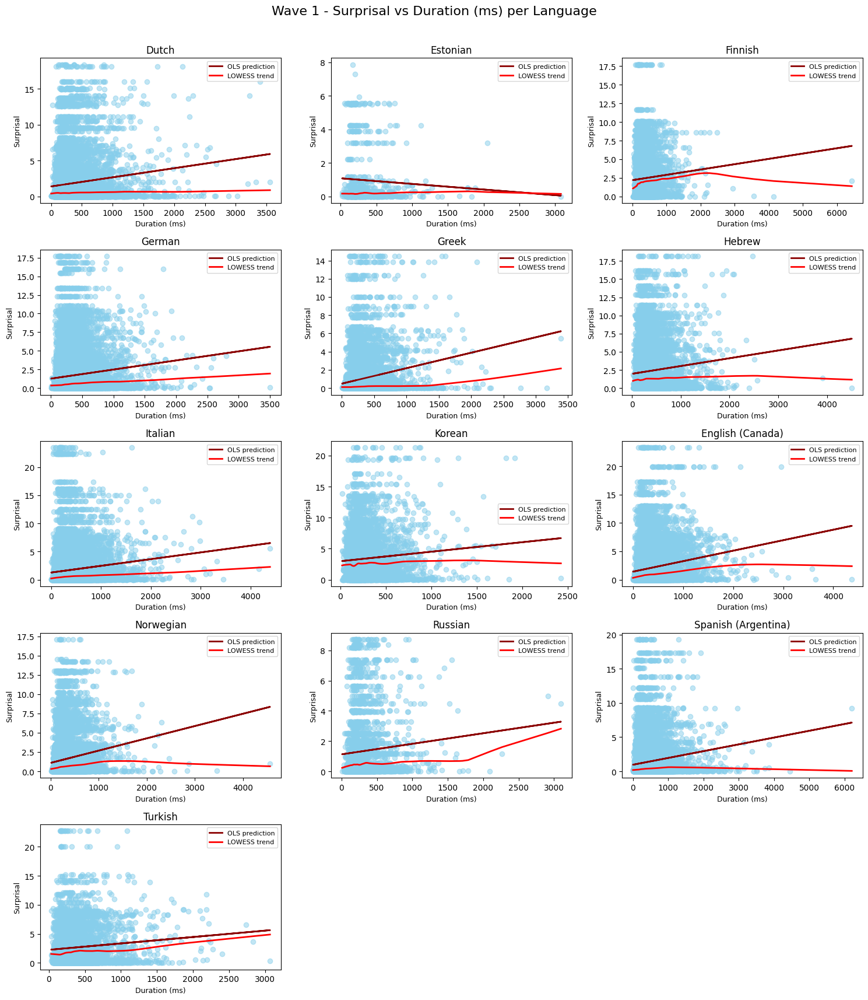

In [100]:
scatter_plot_per_language(wave1_dict, wave1_languages, languages, wave1_OLS, 'dur', 'Duration (ms)', 1)

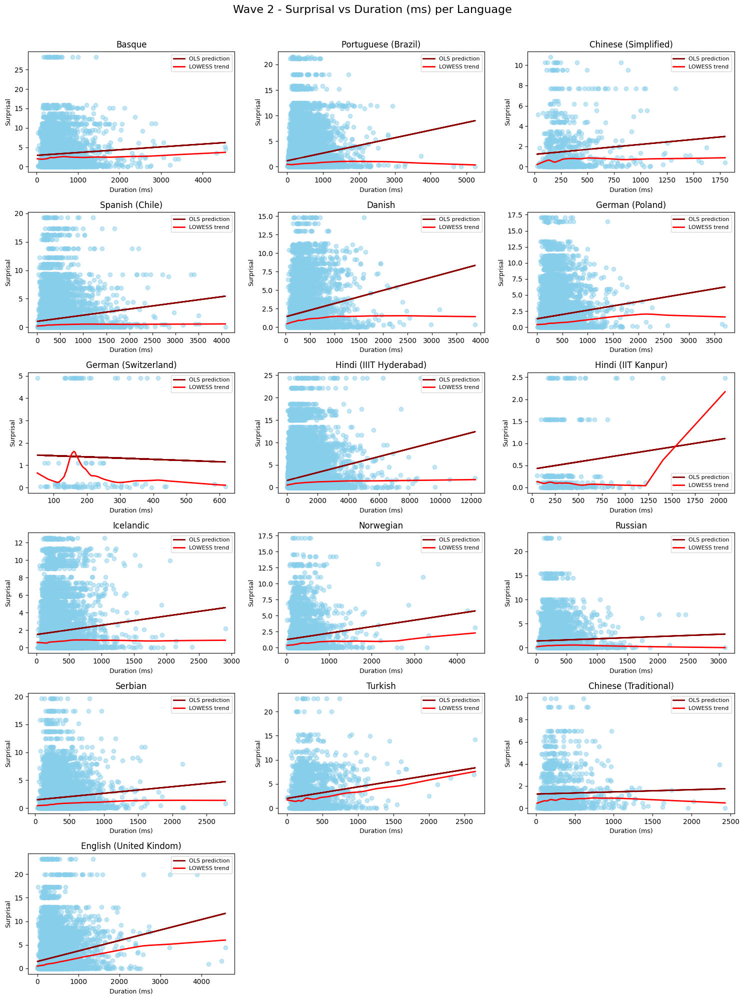

In [101]:
scatter_plot_per_language(wave2_dict, wave2_languages, languages, wave2_OLS, 'dur', 'Duration (ms)', 2)

### Number of Rereads

/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparam

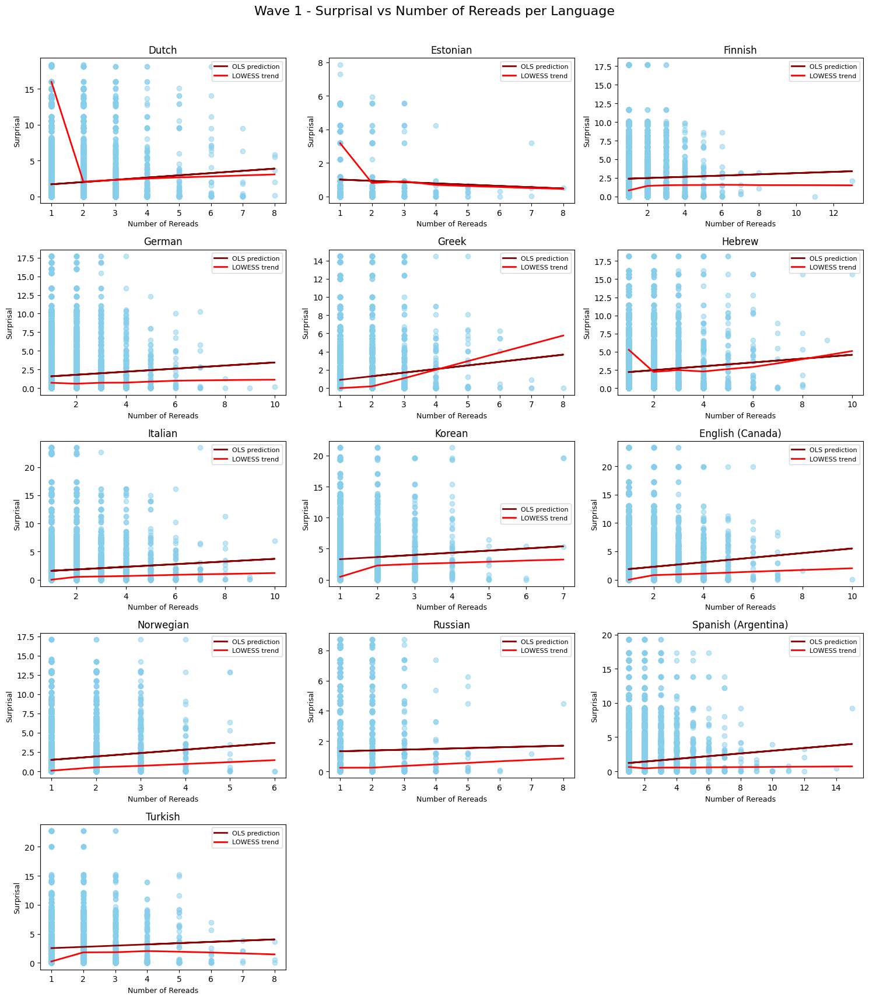

In [82]:
scatter_plot_per_language(wave1_dict, wave1_languages, languages, wave1_OLS, 'nrun', 'Number of Rereads', 1)

/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparam

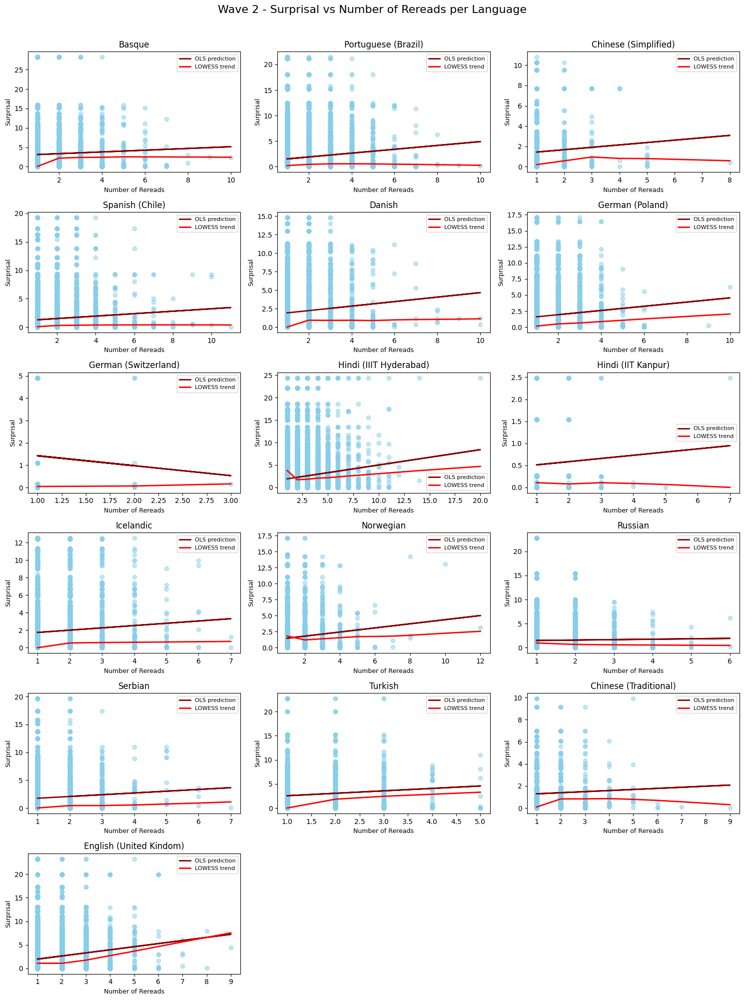

In [83]:
scatter_plot_per_language(wave2_dict, wave2_languages, languages, wave2_OLS, 'nrun', 'Number of Rereads', 2)

### Number of Fixations

/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparam

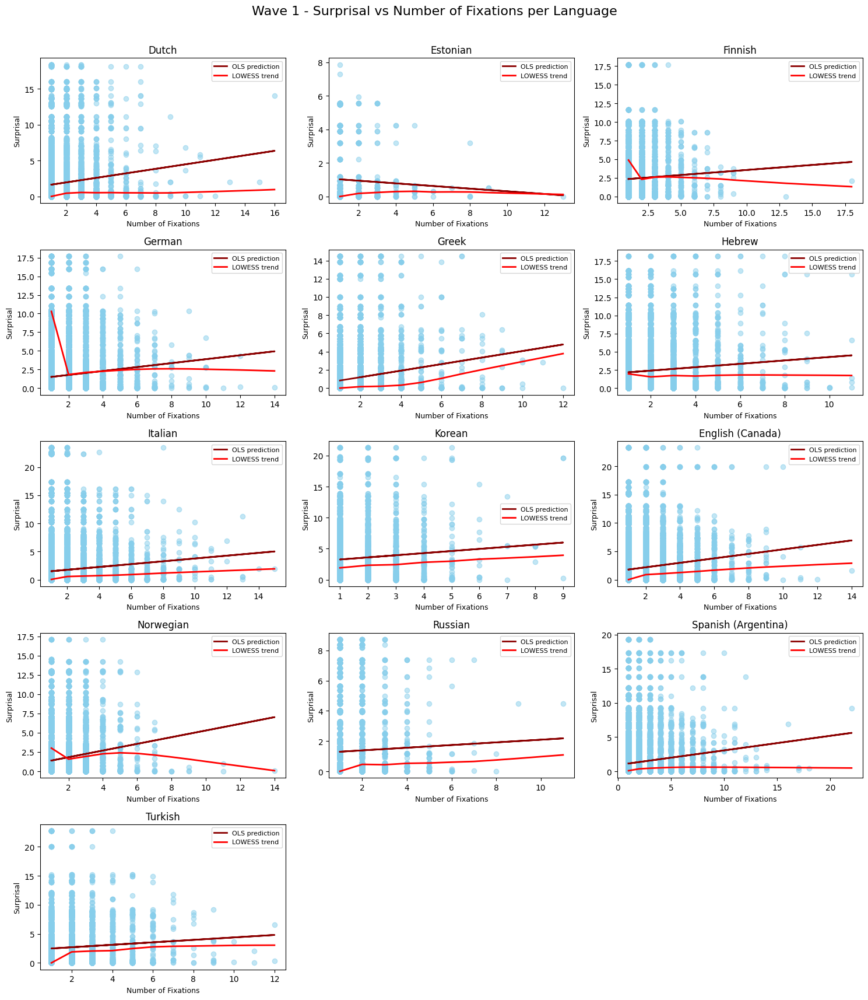

In [84]:
scatter_plot_per_language(wave1_dict, wave1_languages, languages, wave1_OLS, 'nfix', 'Number of Fixations', 1)

/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparam

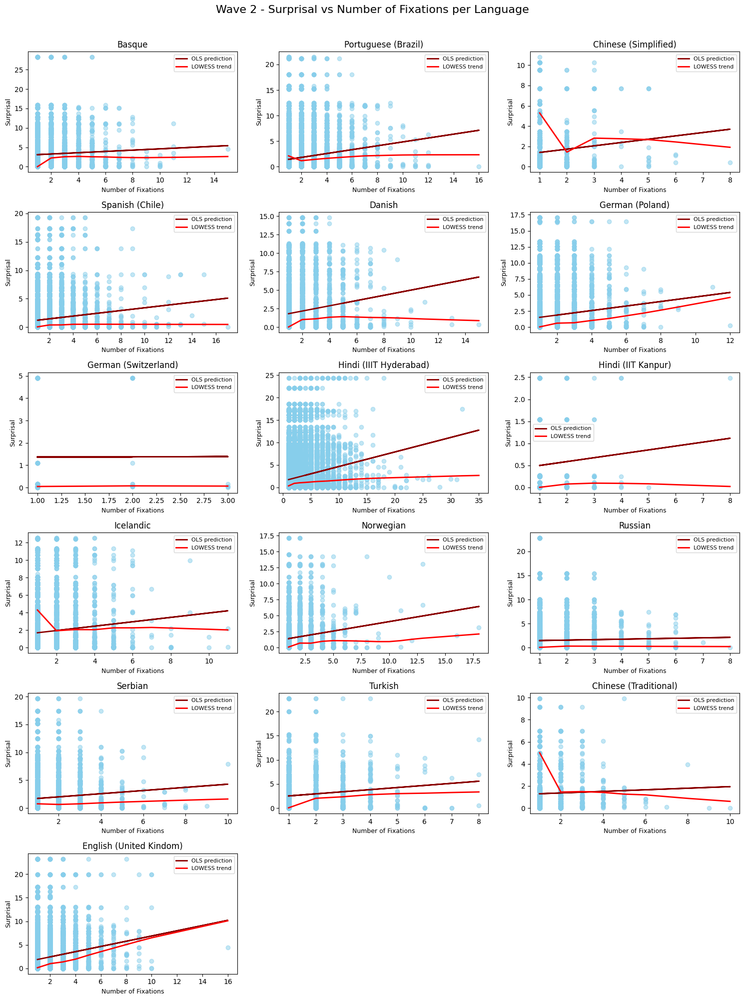

In [85]:
scatter_plot_per_language(wave2_dict, wave2_languages, languages, wave2_OLS, 'nfix', 'Number of Fixations', 2)

### Number of Fixations in the First Run

/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparam

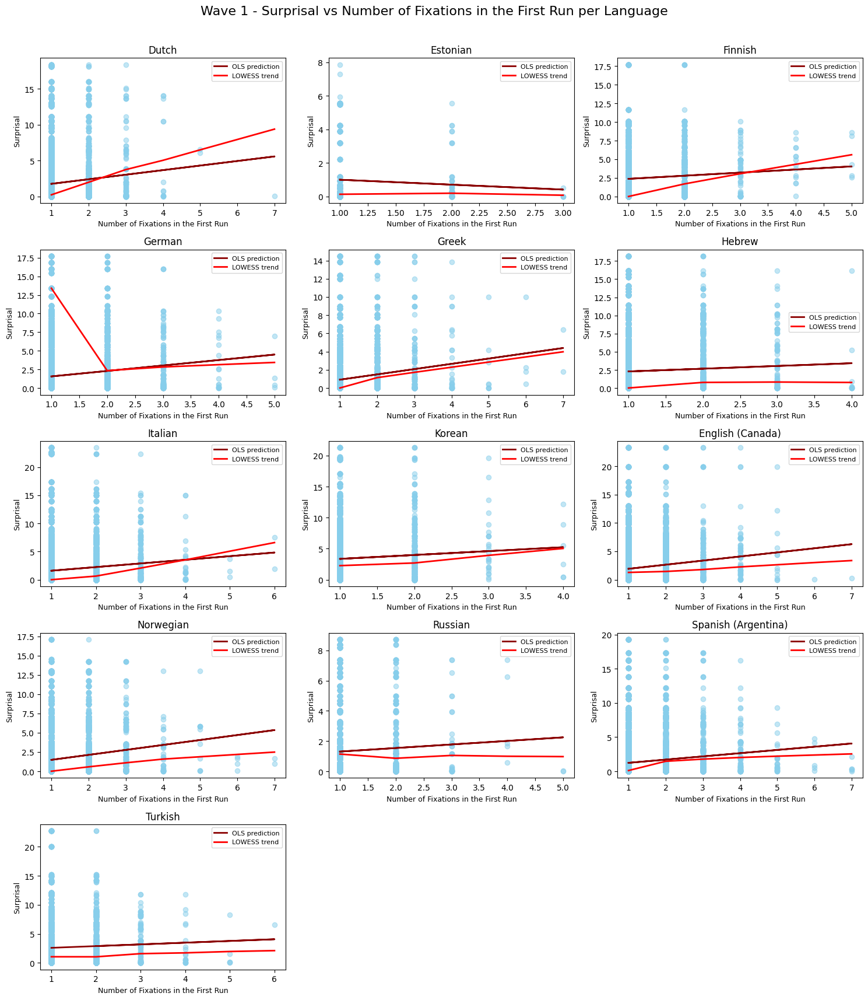

In [86]:
scatter_plot_per_language(wave1_dict, wave1_languages, languages, wave1_OLS, 'firstrun.nfix', 'Number of Fixations in the First Run', 1)

/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparam

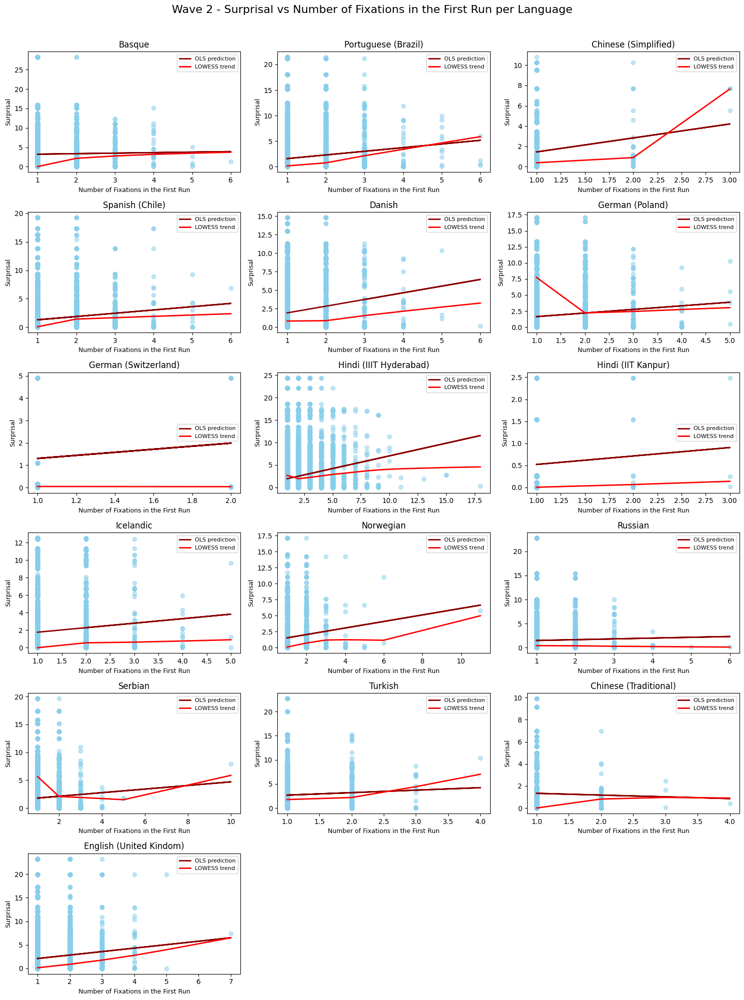

In [87]:
scatter_plot_per_language(wave2_dict, wave2_languages, languages, wave2_OLS, 'firstrun.nfix', 'Number of Fixations in the First Run', 2)

### Duration in the First Run

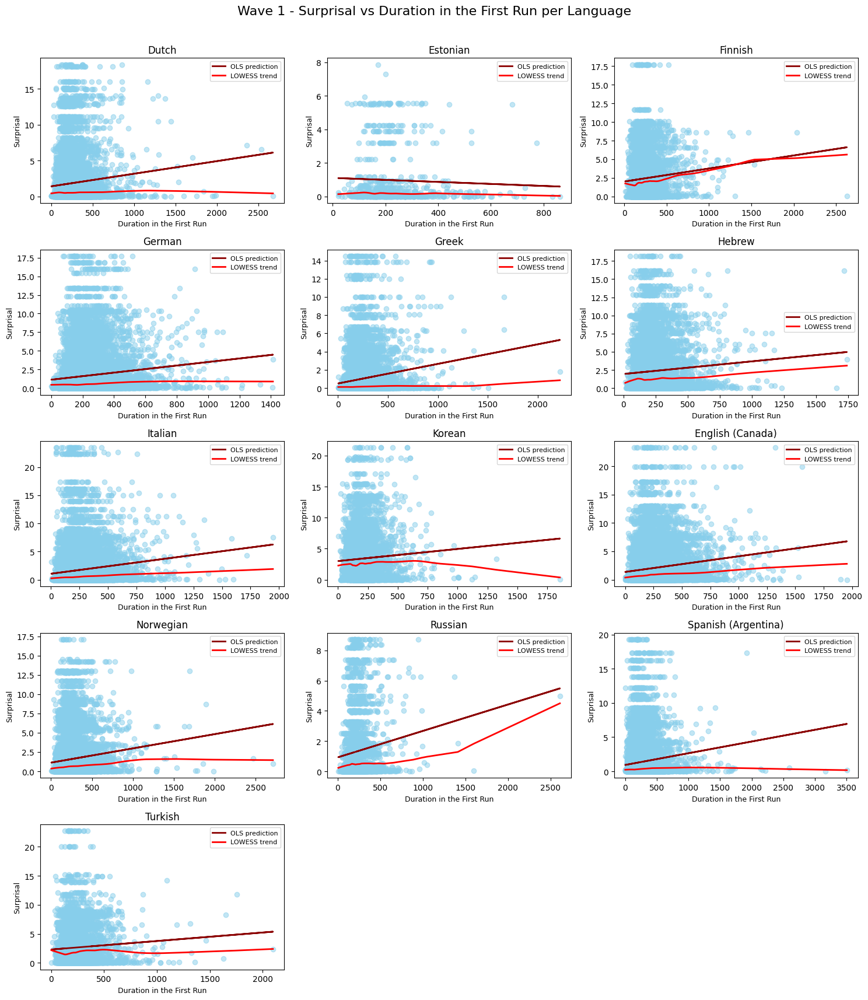

In [88]:
scatter_plot_per_language(wave1_dict, wave1_languages, languages, wave1_OLS, 'firstrun.dur', 'Duration in the First Run', 1)

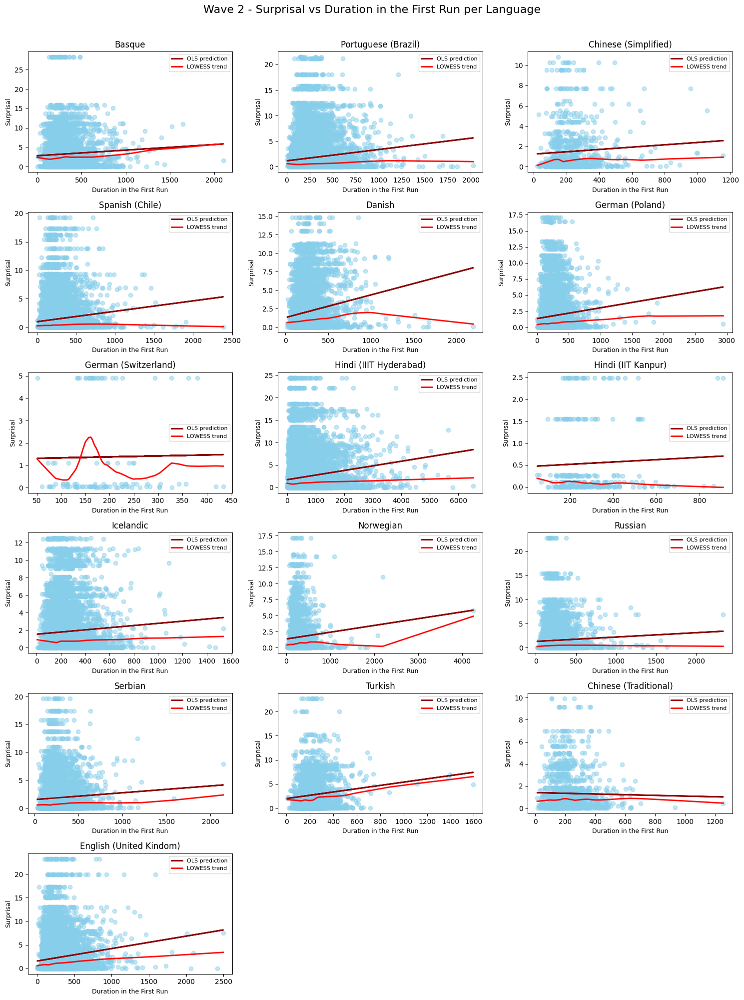

In [89]:
scatter_plot_per_language(wave2_dict, wave2_languages, languages, wave2_OLS, 'firstrun.dur', 'Duration in the First Run', 2)

### Go-Past Time in the First Run

/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparam

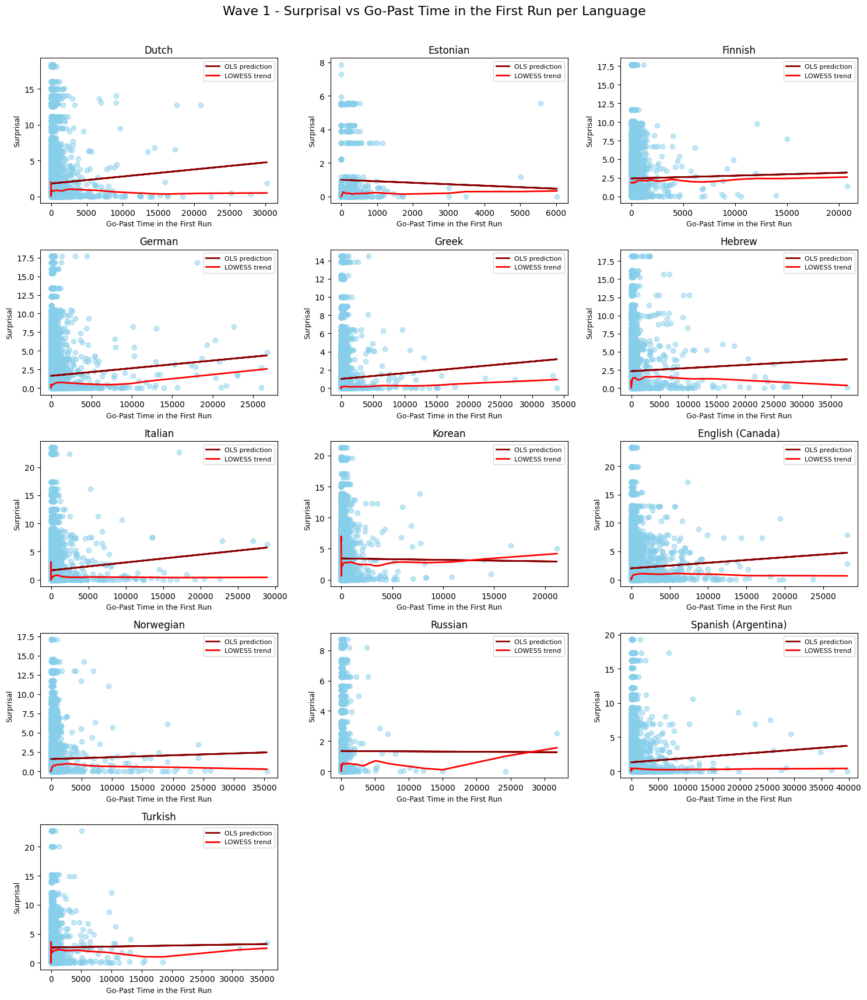

In [90]:
scatter_plot_per_language(wave1_dict, wave1_languages, languages, wave1_OLS, 'firstrun.gopast', 'Go-Past Time in the First Run', 1)

/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparam

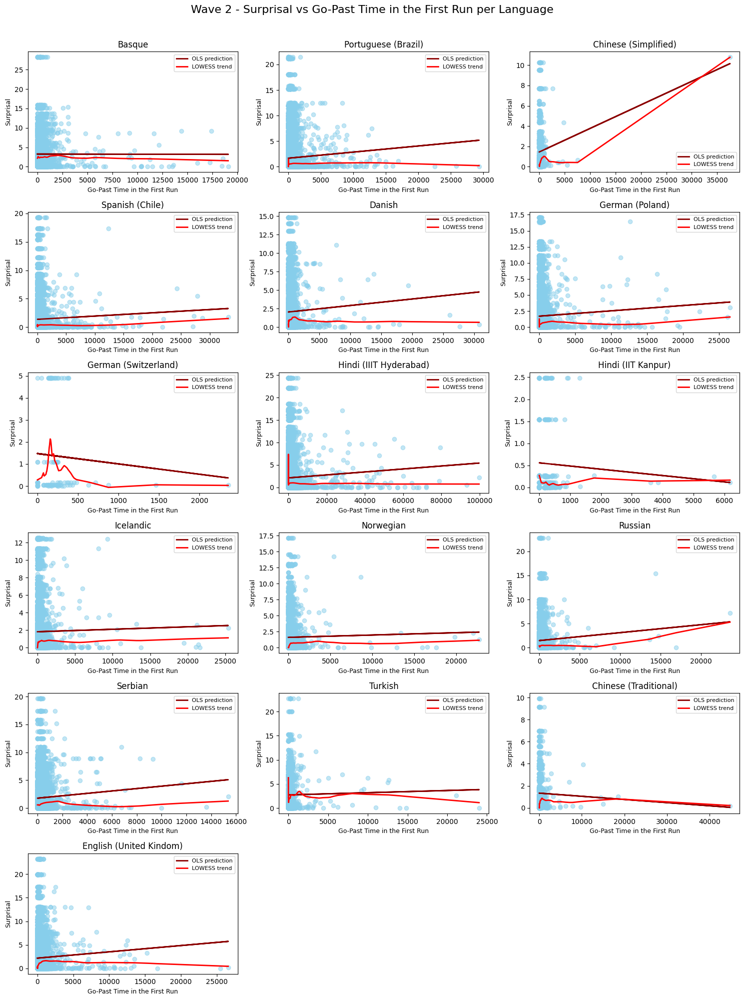

In [91]:
scatter_plot_per_language(wave2_dict, wave2_languages, languages, wave2_OLS, 'firstrun.gopast', 'Go-Past Time in the First Run', 2)

### Selective Go-Past Time in the First Run

/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparam

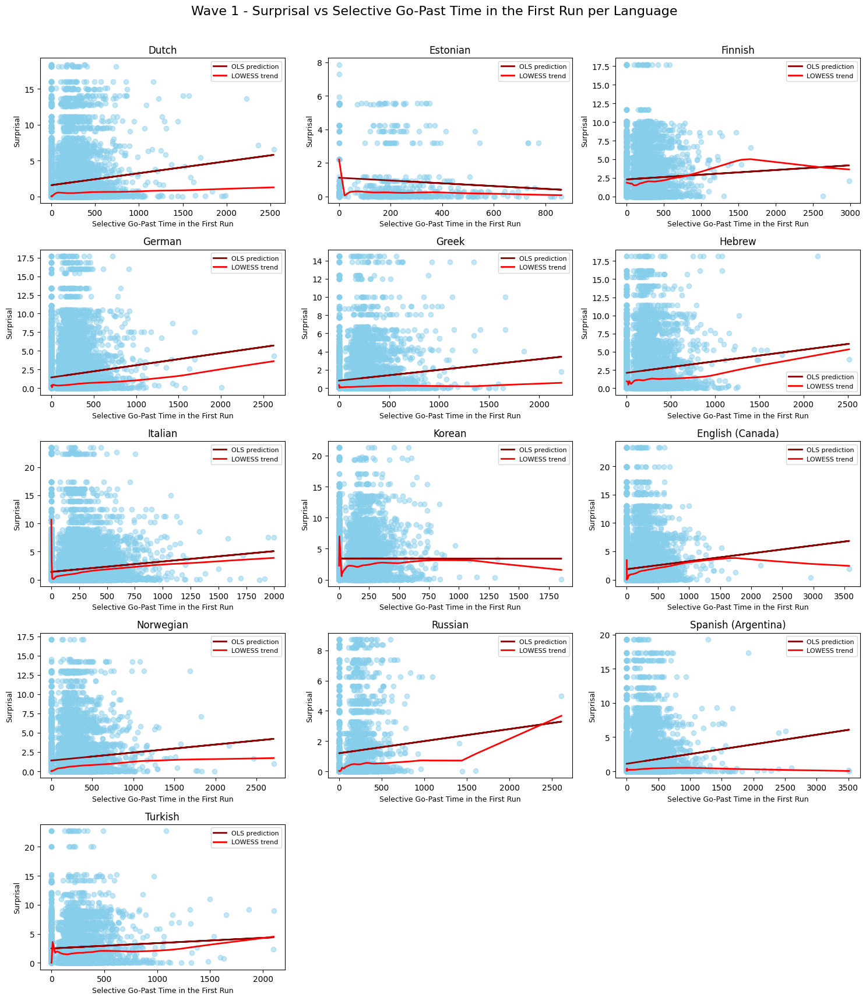

In [92]:
scatter_plot_per_language(wave1_dict, wave1_languages, languages, wave1_OLS, 'firstrun.gopast.sel', 'Selective Go-Past Time in the First Run', 1)

/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/usr/local/lib/python3.11/dist-packages/statsmodels/nonparam

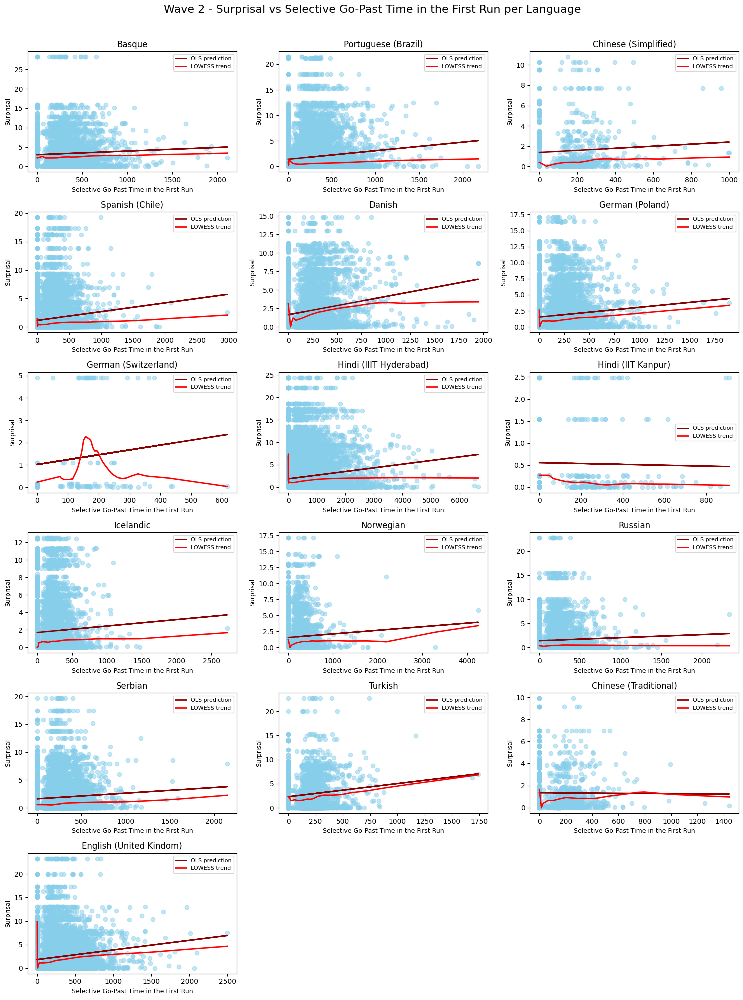

In [93]:
scatter_plot_per_language(wave2_dict, wave2_languages, languages, wave2_OLS, 'firstrun.gopast.sel', 'Selective Go-Past Time in the First Run', 2)

### Incoming Sacade Length in the First Fixation

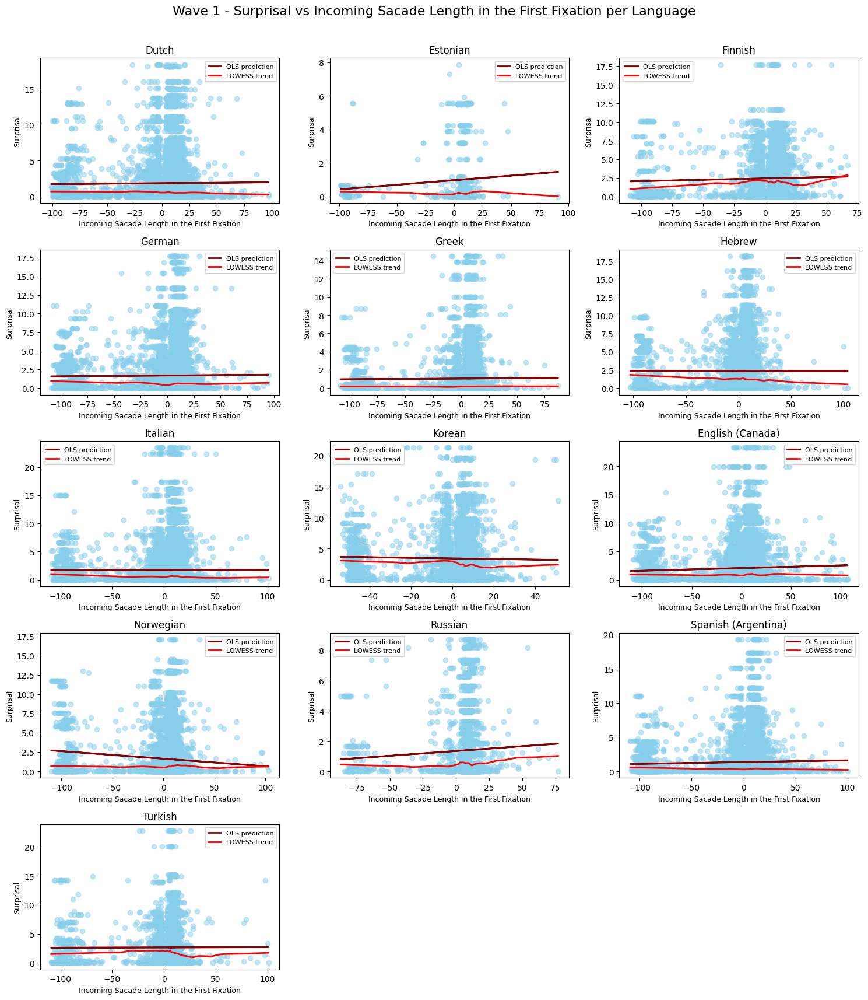

In [94]:
scatter_plot_per_language(wave1_dict, wave1_languages, languages, wave1_OLS, 'firstfix.sac.in', 'Incoming Sacade Length in the First Fixation', 1)

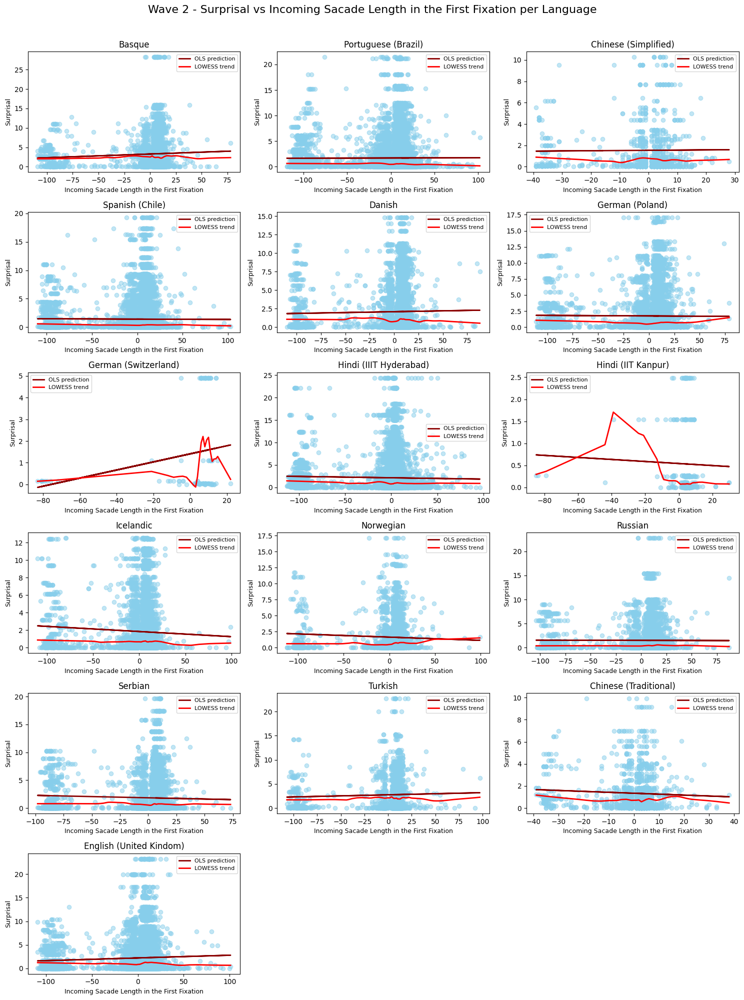

In [95]:
scatter_plot_per_language(wave2_dict, wave2_languages, languages, wave2_OLS, 'firstfix.sac.in', 'Incoming Sacade Length in the First Fixation', 2)

### Outgoing Sacade Length in the First Fixation

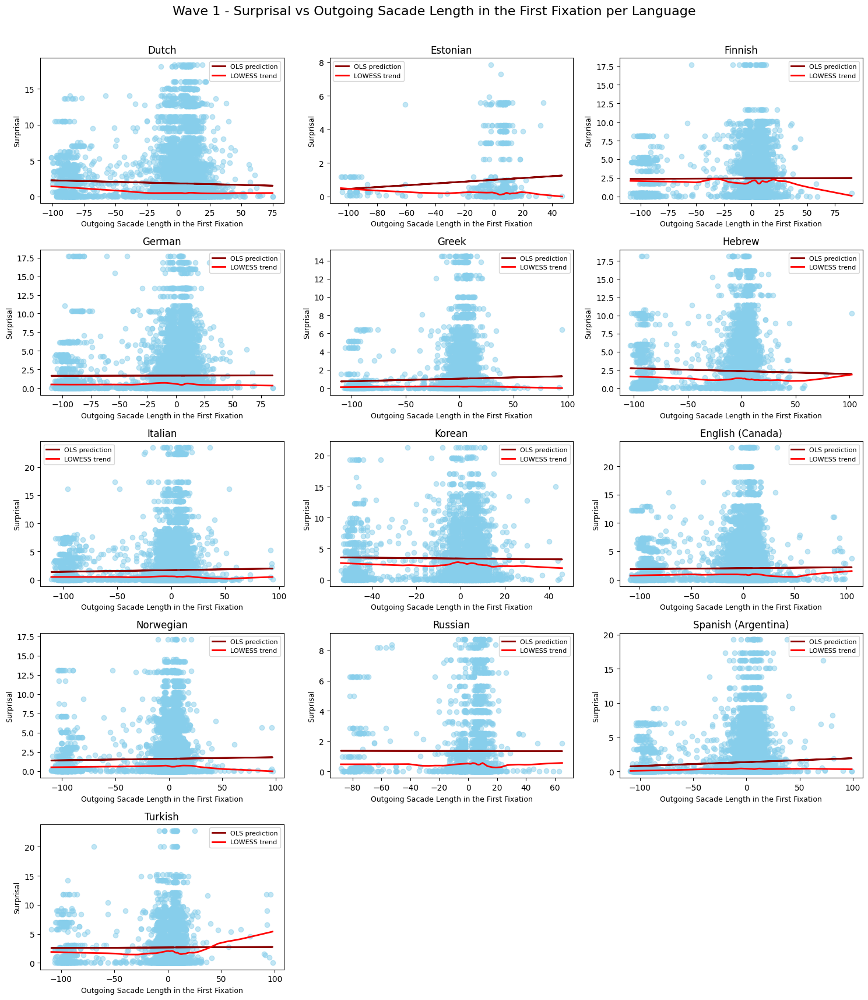

In [96]:
scatter_plot_per_language(wave1_dict, wave1_languages, languages, wave1_OLS, 'firstfix.sac.out', 'Outgoing Sacade Length in the First Fixation', 1)

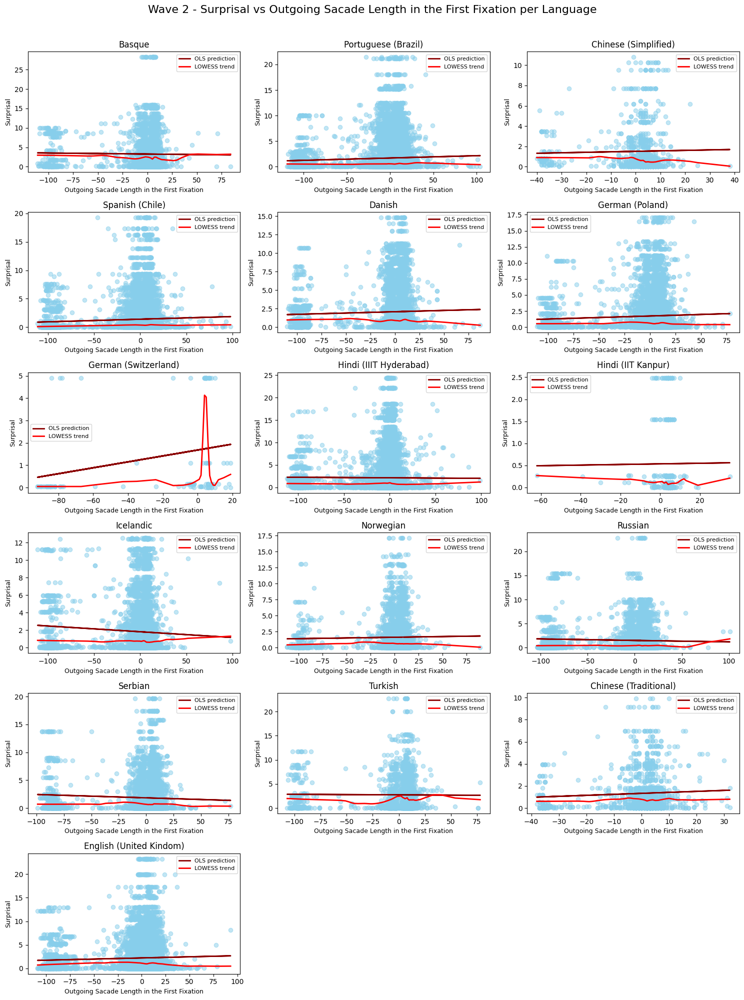

In [97]:
scatter_plot_per_language(wave2_dict, wave2_languages, languages, wave2_OLS, 'firstfix.sac.out', 'Outgoing Sacade Length in the First Fixation', 2)

### Duration in the First Fixation

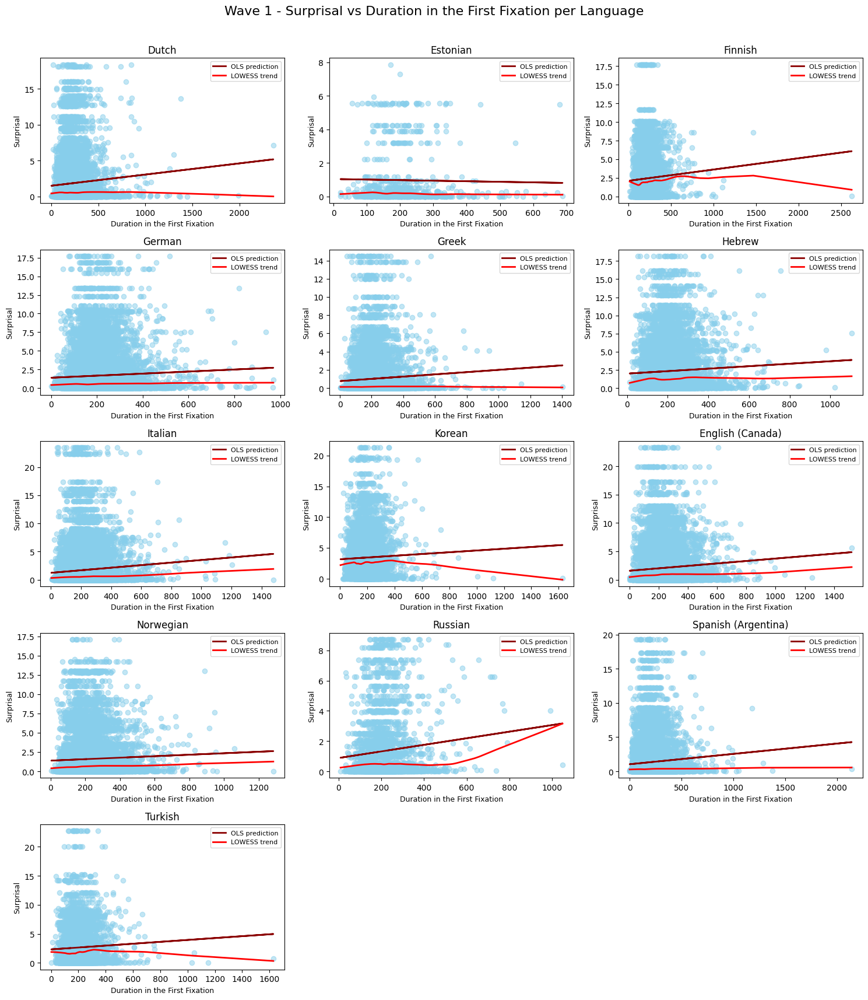

In [98]:
scatter_plot_per_language(wave1_dict, wave1_languages, languages, wave1_OLS, 'firstfix.dur', 'Duration in the First Fixation', 1)

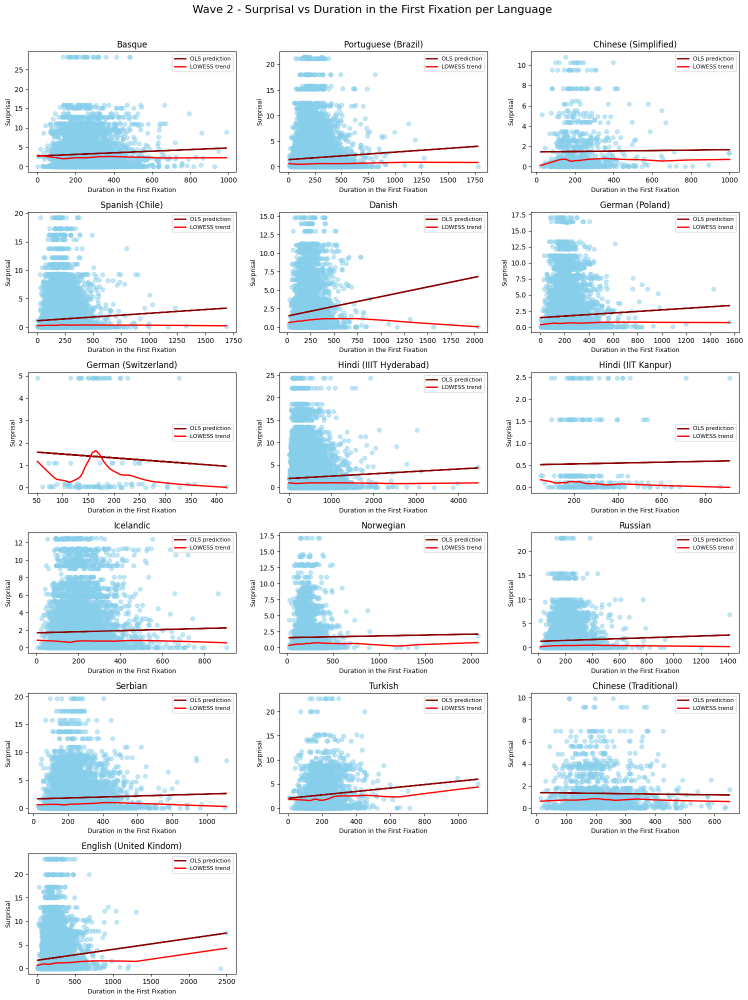

In [99]:
scatter_plot_per_language(wave2_dict, wave2_languages, languages, wave2_OLS, 'firstfix.dur', 'Duration in the First Fixation', 2)